In [47]:
from collections import Counter
from modisco.visualization import viz_sequence
from matplotlib import pyplot as plt

import modisco.affinitymat.core
import modisco.cluster.phenograph.core
import modisco.cluster.phenograph.cluster
import modisco.cluster.core
import modisco.aggregator
import h5py




from deepliftmotifs import Trainer
from motifs import DijkMotifs, FimoMotifs, StubMotifs
import numpy as np
import pandas as pd
from modisco.visualization import viz_sequence

from dijk import get_ordered_data_with_annotations
from collections import defaultdict as ddict
from tfhyp import get_hyp_scores




%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## TODO
- Make get_references + Trainer interaction more OOP
    - best fix: In motifs class, set the references indexes to correspond to non_empty_indices, and set non_empty_indices to seqs in references...then Trainer should work as is

- Remove NULL seqs for now and test (there's noise in a few seqs)
- Somehow reevaluate dijk motifs??? maybe they were good after all rel to refs
- maybe subtract refs from seqs?

In [2]:
df = pd.read_csv('./data/dijk/GSE92306_annotation_all_constructs.tsv', delimiter='\t')

In [3]:
_,_,ann = get_ordered_data_with_annotations()
refs = ddict(int)
setnames = ddict(int)
sequenceNames = ddict(int)
for i in range(len(ann)):
    setnames[ann[i]['SetName']] += 1
    refs[ann[i]['Context']] += 1
    sequenceNames[ann[i]['Sequence']] += 1

## Train Model and Get Scores

In [10]:
t = Trainer(DijkMotifs())

In [33]:
seqmodel = t.trainFullSequence(epochs=400)

(7694, 150, 4)
Epoch 1/400
7694/7694 [==============================] - 1s 142us/step - loss: 0.8094
Epoch 2/400
7694/7694 [==============================] - 0s 31us/step - loss: 0.6771
Epoch 3/400
7694/7694 [==============================] - 0s 31us/step - loss: 0.6077
Epoch 4/400
7694/7694 [==============================] - 0s 32us/step - loss: 0.5474
Epoch 5/400
7694/7694 [==============================] - 0s 31us/step - loss: 0.4914
Epoch 6/400
7694/7694 [==============================] - 0s 30us/step - loss: 0.4390
Epoch 7/400
7694/7694 [==============================] - 0s 30us/step - loss: 0.3918
Epoch 8/400
7694/7694 [==============================] - 0s 32us/step - loss: 0.3555
Epoch 9/400
7694/7694 [==============================] - 0s 29us/step - loss: 0.3265
Epoch 10/400
7694/7694 [==============================] - 0s 29us/step - loss: 0.3050
Epoch 11/400
7694/7694 [==============================] - 0s 29us/step - loss: 0.2904
Epoch 12/400
7694/7694 [=======================

7694/7694 [==============================] - 0s 29us/step - loss: 0.2535
Epoch 97/400
7694/7694 [==============================] - 0s 30us/step - loss: 0.2540
Epoch 98/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2548
Epoch 99/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2545
Epoch 100/400
7694/7694 [==============================] - 0s 29us/step - loss: 0.2555
Epoch 101/400
7694/7694 [==============================] - 0s 29us/step - loss: 0.2532
Epoch 102/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2532
Epoch 103/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2528
Epoch 104/400
7694/7694 [==============================] - 0s 29us/step - loss: 0.2534
Epoch 105/400
7694/7694 [==============================] - 0s 29us/step - loss: 0.2531
Epoch 106/400
7694/7694 [==============================] - 0s 29us/step - loss: 0.2524
Epoch 107/400
7694/7694 [==============================] - 0

7694/7694 [==============================] - 0s 28us/step - loss: 0.2346
Epoch 191/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2353
Epoch 192/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2335
Epoch 193/400
7694/7694 [==============================] - 0s 32us/step - loss: 0.2340
Epoch 194/400
7694/7694 [==============================] - 0s 30us/step - loss: 0.2347
Epoch 195/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2334
Epoch 196/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2329
Epoch 197/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2324
Epoch 198/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2348
Epoch 199/400
7694/7694 [==============================] - 0s 25us/step - loss: 0.2308
Epoch 200/400
7694/7694 [==============================] - 0s 26us/step - loss: 0.2301
Epoch 201/400
7694/7694 [==============================] 

7694/7694 [==============================] - 0s 27us/step - loss: 0.2177
Epoch 285/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2184
Epoch 286/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2181
Epoch 287/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2186
Epoch 288/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2200
Epoch 289/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2201
Epoch 290/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2188
Epoch 291/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2174
Epoch 292/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2159
Epoch 293/400
7694/7694 [==============================] - 0s 26us/step - loss: 0.2185
Epoch 294/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2179
Epoch 295/400
7694/7694 [==============================] 

7694/7694 [==============================] - 0s 27us/step - loss: 0.2103
Epoch 379/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2090
Epoch 380/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2095
Epoch 381/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2097
Epoch 382/400
7694/7694 [==============================] - 0s 27us/step - loss: 0.2093
Epoch 383/400
7694/7694 [==============================] - 0s 26us/step - loss: 0.2080
Epoch 384/400
7694/7694 [==============================] - 0s 26us/step - loss: 0.2104
Epoch 385/400
7694/7694 [==============================] - 0s 26us/step - loss: 0.2093
Epoch 386/400
7694/7694 [==============================] - 0s 26us/step - loss: 0.2095
Epoch 387/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2113
Epoch 388/400
7694/7694 [==============================] - 0s 28us/step - loss: 0.2109
Epoch 389/400
7694/7694 [==============================] 

In [34]:
hyp_scores = get_hyp_scores(seqmodel, t.X[:,0, :, :])
# scores, hypothetical_scores = t.getScores(seqmodel)

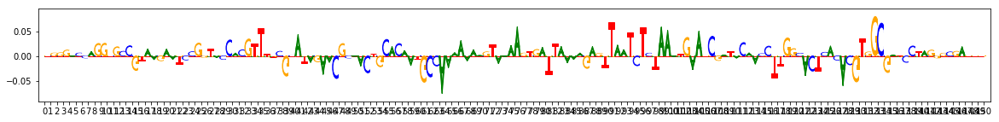

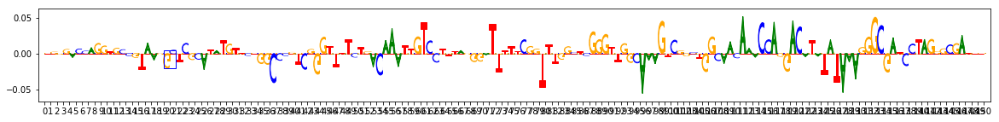

0: ACA


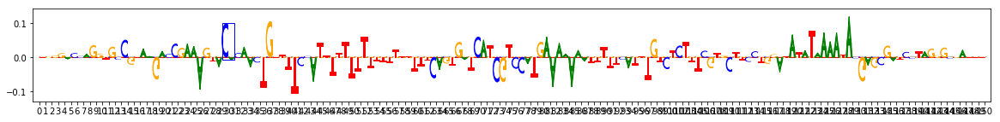

0: TAG


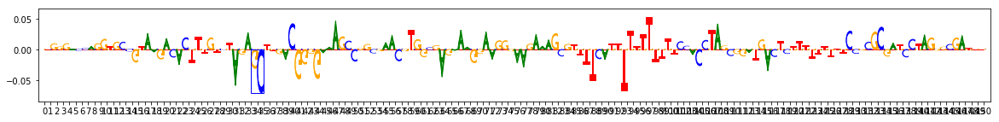

0: GCT


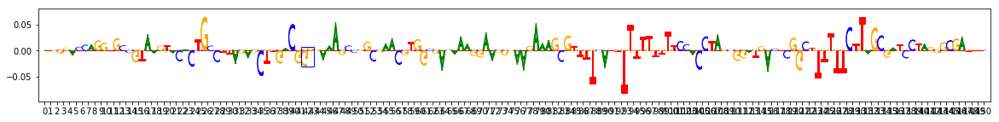

0: GGG


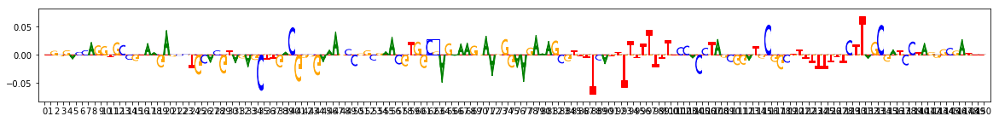

0: CGA


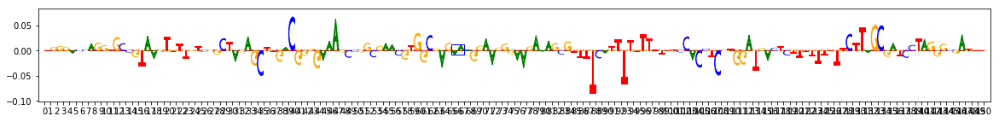

0: AAA


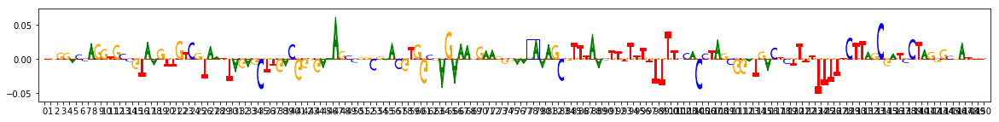

0: GAA


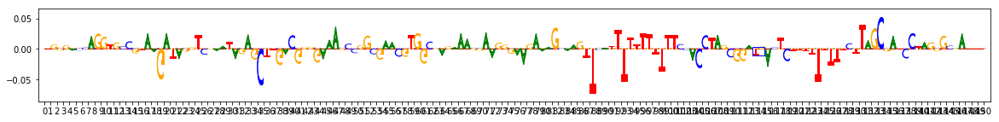

0: TGA


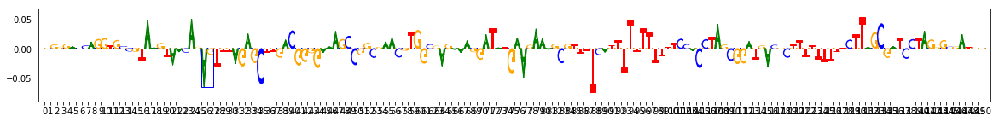

0: ACG


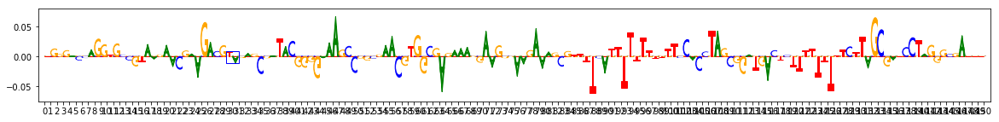

0: CGG


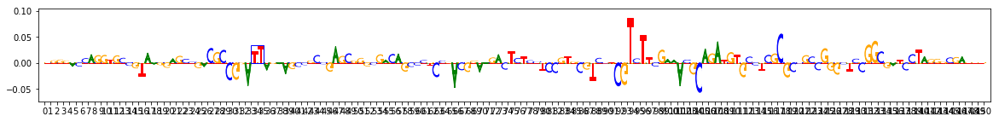

0: TTA


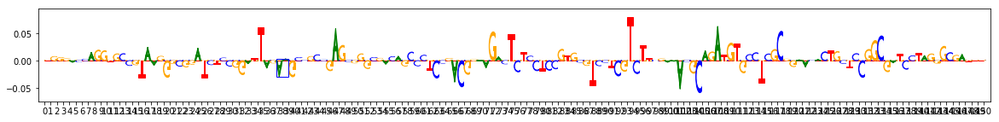

0: AAG


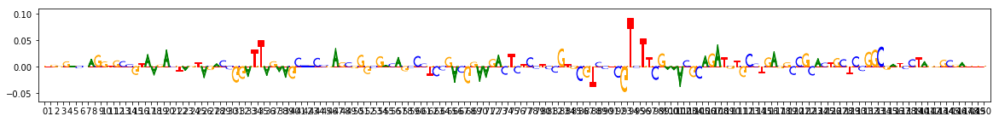

0: CGC


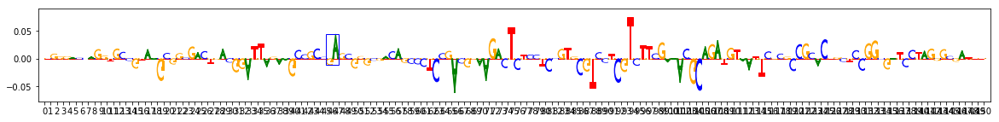

0: GAG


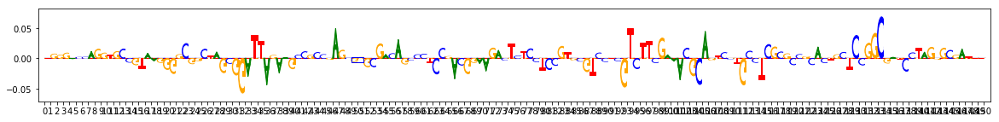

0: GGG


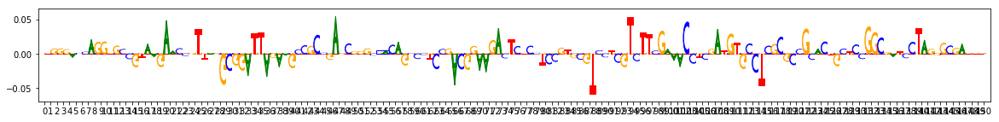

0: GAC


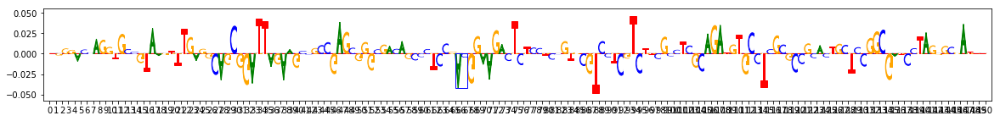

0: ACG


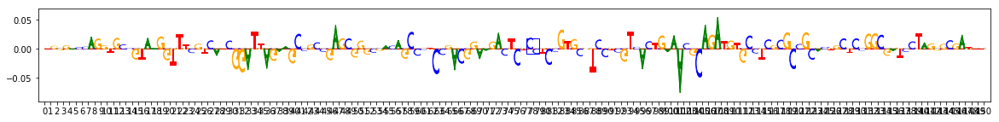

0: CCT


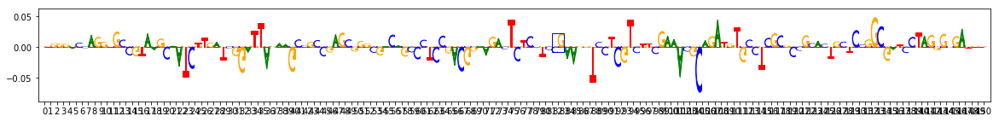

0: CGT


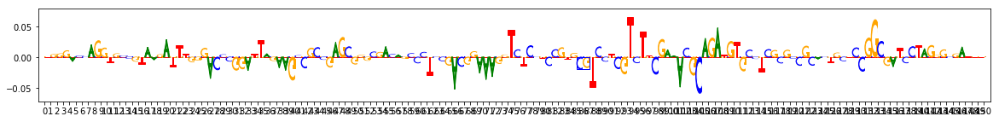

0: CGT
On task task0
Computing windowed sums on original
Generating null dist
peak(mu)= -0.011170742782665158
Computing threshold
Thresholds from null dist were -0.5633509938139469  and  0.5629174080677329
Passing windows frac was 0.00021274213413951406 , which is below  0.03 ; adjusting
Final raw thresholds are -0.22199244091671416  and  0.22199244091671416
Final transformed thresholds are -0.9699985603915735  and  0.9699985603915735


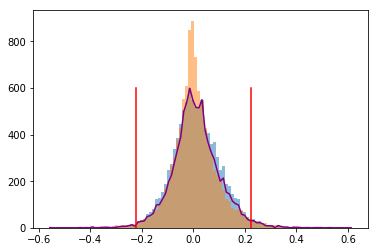

Got 1889 coords
After resolving overlaps, got 1889 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9699984603915736
1889 identified in total
2 activity patterns with support >= 100 out of 3 possible patterns
Metacluster sizes:  [1043, 846]
Idx to activities:  {0: '-1', 1: '1'}
On metacluster 1
Metacluster size 846
Relevant tasks:  ('task0',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 846
(Round 1) Computing coarse affmat
Beginning embedding computation
Computing embeddings
Finished embedding computation in 10.56 s
Starting affinity matrix computations
Normalization computed in 0.16 s
Cosine similarity mat computed in 0.34 s
Normalization computed in 0.14 s
Cosine similarity mat computed in 0.33 s
Finished affinity matrix computations in 0.7 s
(Round 1) Compute nearest neighbors from coarse affmat
Computed nearest neighbors in 0.04 s
(Round 1) Computing affinity matrix on nearest neighbors
Launching nearest neighbors

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.9705560207366943 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.7s finished


Wrote graph to binary file in 0.16196608543395996 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.779517
Louvain completed 51 runs in 2.7882866859436035 seconds
Preproc + Louvain took 5.082961797714233 s
Got 13 clusters after round 1
Counts:
{5: 59, 7: 52, 3: 61, 11: 8, 8: 39, 1: 92, 0: 145, 12: 4, 6: 55, 2: 61, 4: 59, 9: 37, 10: 11}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 145 seqlets
Trimmed 13 out of 145
Aggregating for cluster 1 with 92 seqlets
Trimmed 8 out of 92
Skipped 83 seqlets
Aggregating for cluster 2 with 61 seqlets
Trimmed 1 out of 61
Skipped 60 seqlets
Aggregating for cluster 3 with 61 seqlets
Trimmed 9 out of 61
Skipped 52 seqlets
Aggregating for cluster 4 with 59 seqlets
Trimmed 11 out of 59
Skipped 48 seqlets
Aggregating for cluster 5 with 59 seqlets
Trimmed 6 out of 59
Aggregating for cluster 6 with 55 seqlets
Trimmed 27 out of 55
Aggregating for cluster 7 with 52 seqlets
Trimmed 3 out of 52

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.4150402545928955 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.3s finished


Wrote graph to binary file in 0.04877495765686035 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.694357
After 7 runs, maximum modularity is Q = 0.705687
After 16 runs, maximum modularity is Q = 0.705872
Louvain completed 66 runs in 3.6115822792053223 seconds
Preproc + Louvain took 5.1315016746521 s
Got 8 clusters after round 2
Counts:
{1: 39, 0: 46, 2: 33, 6: 14, 5: 23, 4: 32, 3: 32, 7: 8}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 46 seqlets
Trimmed 0 out of 46
Skipped 46 seqlets
Aggregating for cluster 1 with 39 seqlets
Trimmed 1 out of 39
Skipped 38 seqlets
Aggregating for cluster 2 with 33 seqlets
Trimmed 0 out of 33
Skipped 33 seqlets
Aggregating for cluster 3 with 32 seqlets
Trimmed 4 out of 32
Aggregating for cluster 4 with 32 seqlets
Trimmed 6 out of 32
Aggregating for cluster 5 with 23 seqlets
Trimmed 2 out of 23
Aggregating for cluster 6 with 14 seqlets
Trimmed 0 out of 14
Skipped 14 seqlets
Aggregat

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.9s finished


Louvain completed 200 runs in 2.2060413360595703 seconds
Wrote graph to binary file in 0.2779068946838379 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.859375
Louvain completed 51 runs in 2.89453387260437 seconds
Preproc + Louvain took 5.56295919418335 s
Got 14 clusters after round 1
Counts:
{2: 104, 6: 63, 1: 105, 7: 62, 0: 107, 13: 9, 3: 84, 12: 11, 5: 72, 10: 25, 9: 32, 11: 20, 8: 49, 4: 82}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 107 seqlets
Trimmed 4 out of 107
Aggregating for cluster 1 with 105 seqlets
Trimmed 10 out of 105
Aggregating for cluster 2 with 104 seqlets
Trimmed 19 out of 104
Aggregating for cluster 3 with 84 seqlets
Trimmed 13 out of 84
Skipped 71 seqlets
Aggregating for cluster 4 with 82 seqlets
Trimmed 3 out of 82
Skipped 79 seqlets
Aggregating for cluster 5 with 72 seqlets
Trimmed 4 out of 72
Skipped 67 seqlets
Aggregating for cluster 6 with 63 seqlets
Trimmed 9 out of 63
Aggregating 

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.6489107608795166 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.5s finished


Wrote graph to binary file in 0.12762188911437988 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.776544
After 9 runs, maximum modularity is Q = 0.779759
Louvain completed 59 runs in 3.2277326583862305 seconds
Preproc + Louvain took 5.142343997955322 s
Got 9 clusters after round 2
Counts:
{2: 75, 6: 19, 8: 13, 7: 18, 1: 90, 5: 22, 4: 53, 0: 95, 3: 73}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 95 seqlets
Trimmed 9 out of 95
Skipped 86 seqlets
Aggregating for cluster 1 with 90 seqlets
Trimmed 3 out of 90
Aggregating for cluster 2 with 75 seqlets
Trimmed 1 out of 75
Aggregating for cluster 3 with 73 seqlets
Trimmed 2 out of 73
Skipped 71 seqlets
Aggregating for cluster 4 with 53 seqlets
Trimmed 3 out of 53
Dropping cluster 4 with 50 seqlets due to sign disagreement
Aggregating for cluster 5 with 22 seqlets
Trimmed 0 out of 22
Aggregating for cluster 6 with 19 seqlets
Trimmed 0 out of 19
Dropping cluster 6 with 17

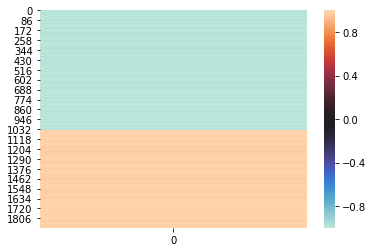

metacluster_0
activity pattern: [-1]
metacluster_0 pattern_0
Task 0 hypothetical scores:


/home/ryan/anaconda3/envs/genomics/lib/python3.6/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


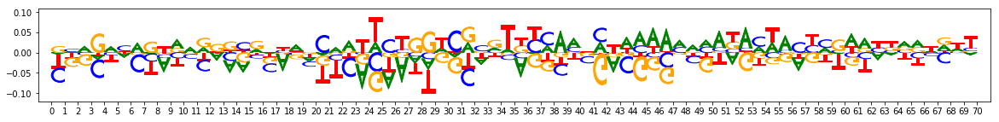

Task 0 actual importance scores:


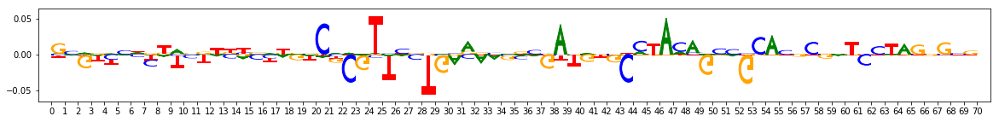

onehot, fwd and rev:


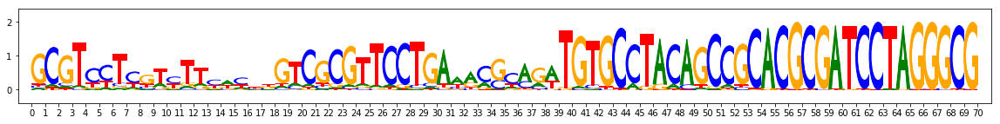

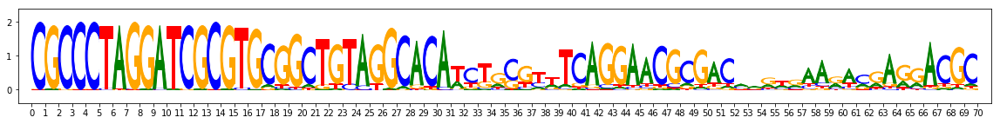

metacluster_0 pattern_1
Task 0 hypothetical scores:


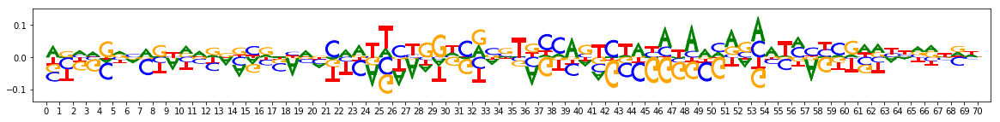

Task 0 actual importance scores:


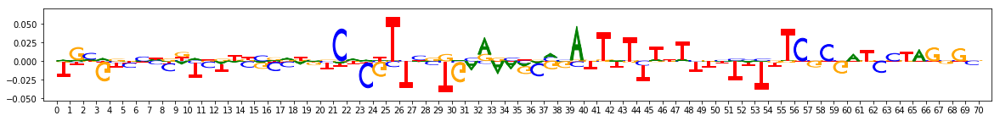

onehot, fwd and rev:


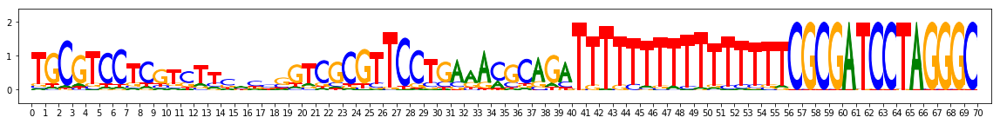

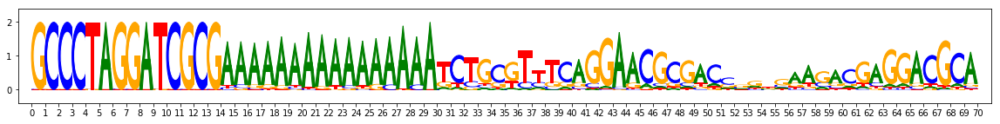

metacluster_1
activity pattern: [1]
No motifs found for this activity pattern


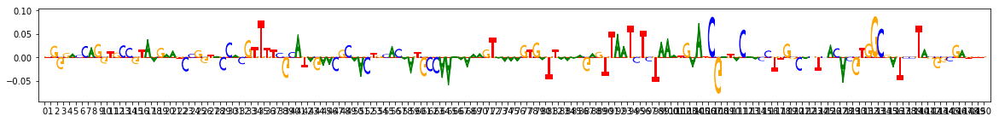

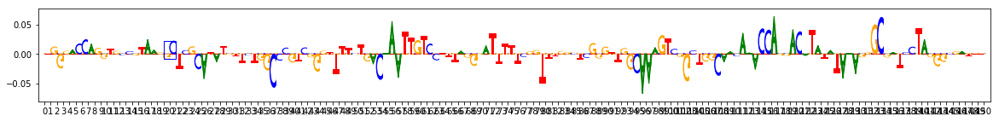

0: ACA


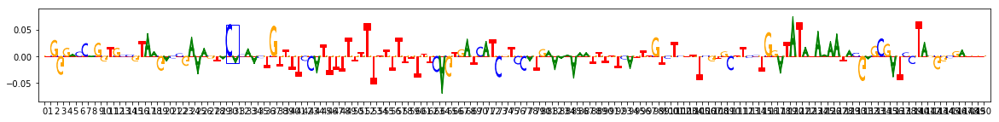

0: TAG


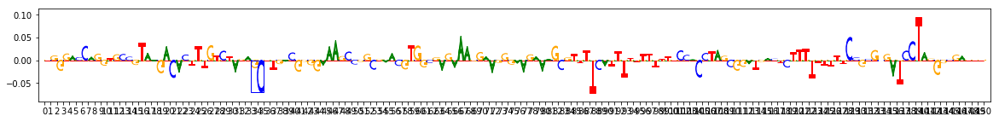

0: GCT


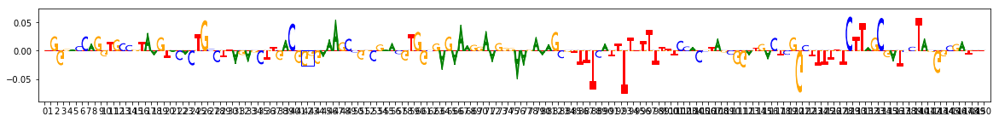

0: GGG


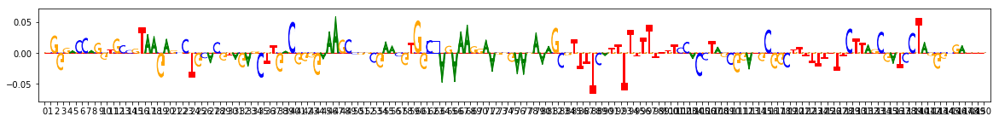

0: CGA


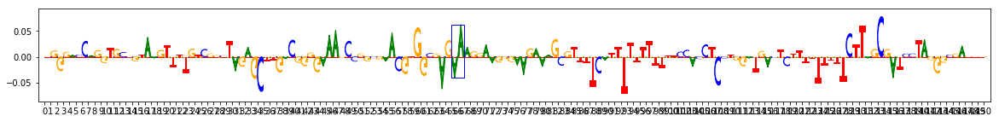

0: AAA


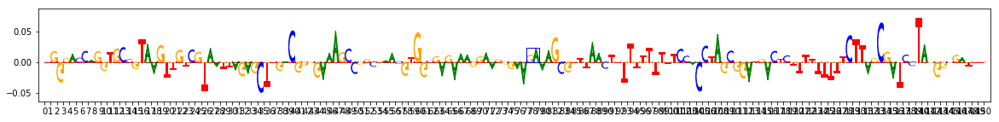

0: GAA


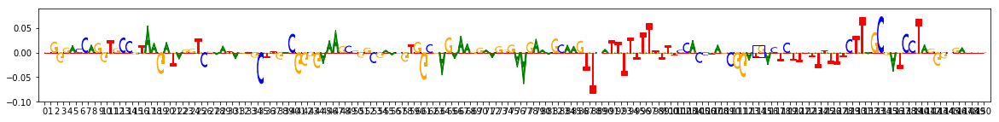

0: TGA


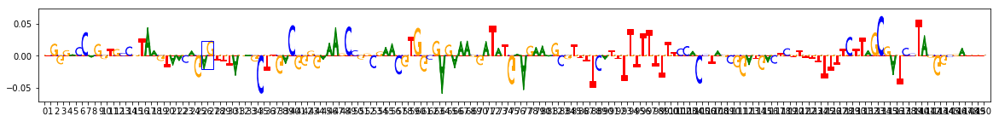

0: ACG


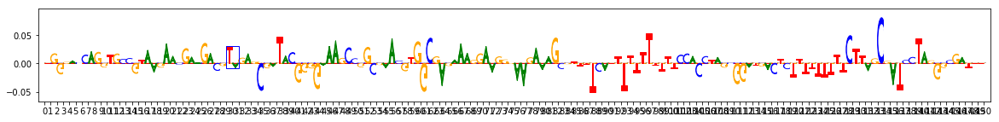

0: CGG


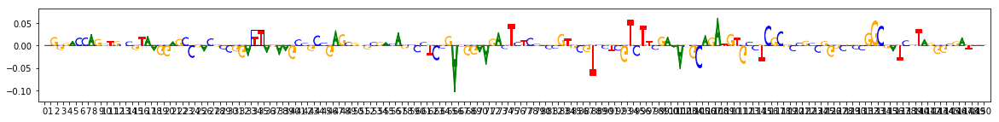

0: TTA


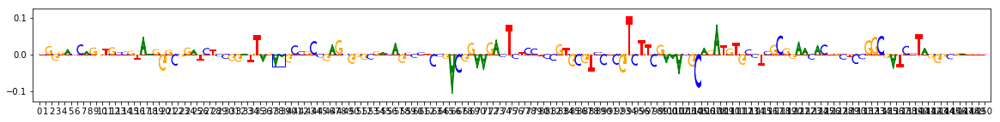

0: AAG


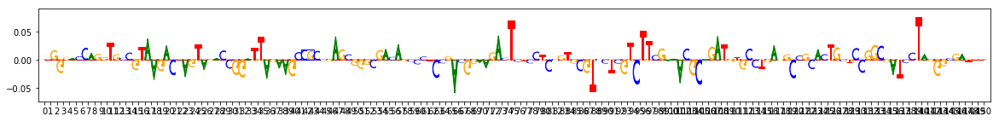

0: CGC


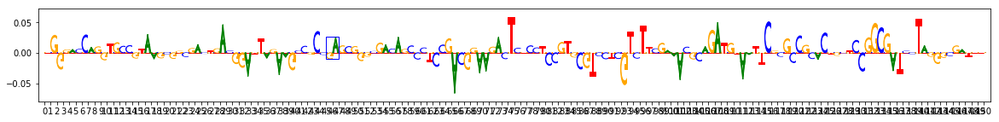

0: GAG


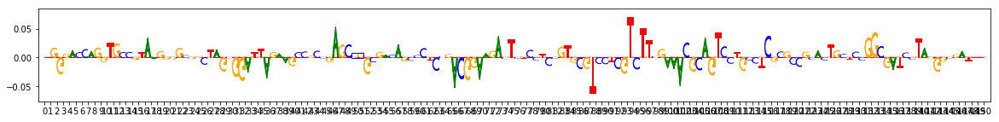

0: GGG


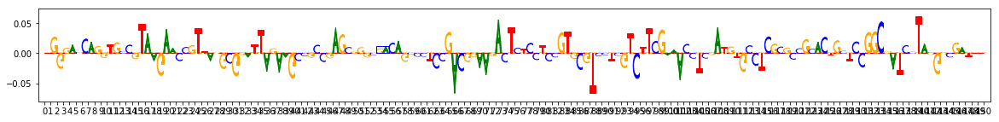

0: GAC


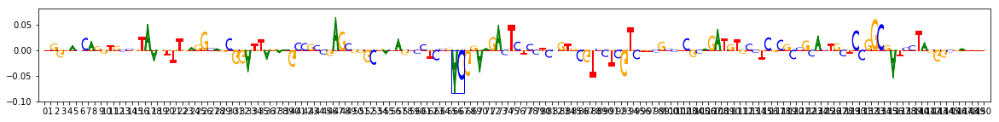

0: ACG


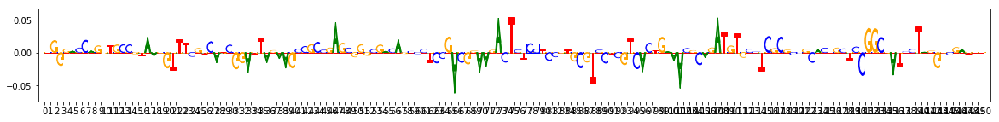

0: CCT


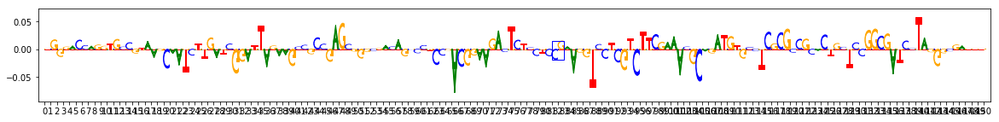

0: CGT


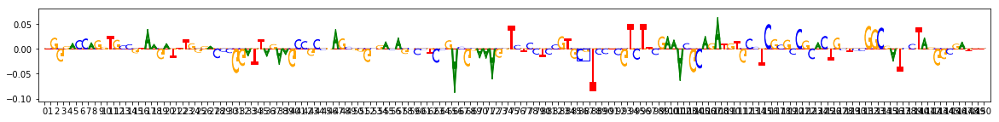

0: CGT
On task task0
Computing windowed sums on original
Generating null dist
peak(mu)= -0.0046700873511406876
Computing threshold
Thresholds from null dist were -0.6466315812896937  and  0.5241957378922961
Passing windows frac was 0.0003375081977702065 , which is below  0.03 ; adjusting
Final raw thresholds are -0.2130296136467368  and  0.2130296136467368
Final transformed thresholds are -0.9699985603915735  and  0.9699985603915735


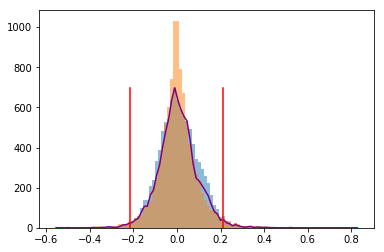

Got 2493 coords
After resolving overlaps, got 2493 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9699984603915736
2493 identified in total
2 activity patterns with support >= 100 out of 3 possible patterns
Metacluster sizes:  [1338, 1155]
Idx to activities:  {0: '-1', 1: '1'}
On metacluster 1
Metacluster size 1155
Relevant tasks:  ('task0',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 1155
(Round 1) Computing coarse affmat
Beginning embedding computation
Computing embeddings
Finished embedding computation in 14.26 s
Starting affinity matrix computations
Normalization computed in 0.21 s
Cosine similarity mat computed in 0.55 s
Normalization computed in 0.2 s
Cosine similarity mat computed in 0.55 s
Finished affinity matrix computations in 1.12 s
(Round 1) Compute nearest neighbors from coarse affmat
Computed nearest neighbors in 0.05 s
(Round 1) Computing affinity matrix on nearest neighbors
Launching nearest neighb

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.0s finished


Louvain completed 200 runs in 2.4148645401000977 seconds
Wrote graph to binary file in 0.2236034870147705 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.821336
Louvain completed 51 runs in 2.9847254753112793 seconds
Preproc + Louvain took 5.829569339752197 s
Got 13 clusters after round 1
Counts:
{7: 64, 11: 18, 12: 14, 5: 72, 1: 122, 3: 79, 0: 159, 4: 73, 9: 51, 10: 50, 8: 59, 6: 71, 2: 80}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 159 seqlets
Trimmed 23 out of 159
Skipped 2 seqlets
Aggregating for cluster 1 with 122 seqlets
Trimmed 19 out of 122
Skipped 103 seqlets
Aggregating for cluster 2 with 80 seqlets
Trimmed 29 out of 80
Skipped 51 seqlets
Aggregating for cluster 3 with 79 seqlets
Trimmed 13 out of 79
Skipped 1 seqlets
Aggregating for cluster 4 with 73 seqlets
Trimmed 7 out of 73
Skipped 66 seqlets
Aggregating for cluster 5 with 72 seqlets
Trimmed 14 out of 72
Skipped 58 seqlets
Aggregating for cluster

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.4268155097961426 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.3s finished


Wrote graph to binary file in 0.08168649673461914 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.734787
After 2 runs, maximum modularity is Q = 0.73484
Louvain completed 52 runs in 2.8635332584381104 seconds
Preproc + Louvain took 4.459959268569946 s
Got 7 clusters after round 2
Counts:
{0: 62, 1: 50, 3: 38, 2: 45, 5: 21, 4: 34, 6: 18}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 62 seqlets
Trimmed 5 out of 62
Skipped 57 seqlets
Aggregating for cluster 1 with 50 seqlets
Trimmed 6 out of 50
Skipped 44 seqlets
Aggregating for cluster 2 with 45 seqlets
Trimmed 0 out of 45
Aggregating for cluster 3 with 38 seqlets
Trimmed 5 out of 38
Skipped 33 seqlets
Aggregating for cluster 4 with 34 seqlets
Trimmed 2 out of 34
Skipped 32 seqlets
Aggregating for cluster 5 with 21 seqlets
Trimmed 1 out of 21
Aggregating for cluster 6 with 18 seqlets
Trimmed 2 out of 18
Skipped 15 seqlets
Got 3 clusters
Splitting into subclusters...

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.1s finished


Louvain completed 200 runs in 2.551356077194214 seconds
Wrote graph to binary file in 0.6829862594604492 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.841594
Louvain completed 51 runs in 3.2747268676757812 seconds
Preproc + Louvain took 6.8089280128479 s
Got 13 clusters after round 1
Counts:
{5: 85, 0: 183, 3: 98, 2: 107, 1: 164, 4: 92, 7: 62, 10: 36, 9: 41, 8: 52, 11: 18, 6: 84, 12: 17}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 183 seqlets
Trimmed 25 out of 183
Aggregating for cluster 1 with 164 seqlets
Trimmed 51 out of 164
Aggregating for cluster 2 with 107 seqlets
Trimmed 18 out of 107
Aggregating for cluster 3 with 98 seqlets
Trimmed 16 out of 98
Skipped 82 seqlets
Aggregating for cluster 4 with 92 seqlets
Trimmed 11 out of 92
Skipped 81 seqlets
Aggregating for cluster 5 with 85 seqlets
Trimmed 18 out of 85
Aggregating for cluster 6 with 84 seqlets
Trimmed 6 out of 84
Skipped 78 seqlets
Aggregating for 

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.650902509689331 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.5s finished


Wrote graph to binary file in 0.14353680610656738 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.721617
After 27 runs, maximum modularity is Q = 0.727212
After 57 runs, maximum modularity is Q = 0.728816
Louvain completed 107 runs in 6.1466639041900635 seconds
Preproc + Louvain took 8.055182456970215 s
Got 10 clusters after round 2
Counts:
{3: 44, 2: 63, 9: 11, 1: 87, 4: 43, 0: 111, 5: 36, 6: 32, 7: 15, 8: 12}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 111 seqlets
Trimmed 0 out of 111
Dropping cluster 0 with 111 seqlets due to sign disagreement
Aggregating for cluster 1 with 87 seqlets
Trimmed 1 out of 87
Skipped 85 seqlets
Aggregating for cluster 2 with 63 seqlets
Trimmed 3 out of 63
Aggregating for cluster 3 with 44 seqlets
Trimmed 1 out of 44
Aggregating for cluster 4 with 43 seqlets
Trimmed 0 out of 43
Aggregating for cluster 5 with 36 seqlets
Trimmed 2 out of 36
Aggregating for cluster 6 with 32 seqlets
T

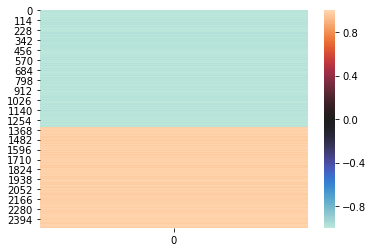

metacluster_0
activity pattern: [-1]
metacluster_0 pattern_0
Task 0 hypothetical scores:


/home/ryan/anaconda3/envs/genomics/lib/python3.6/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


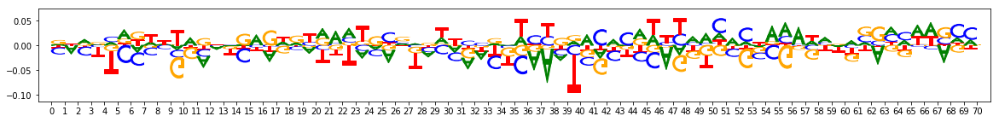

Task 0 actual importance scores:


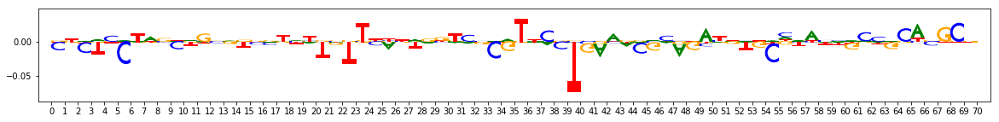

onehot, fwd and rev:


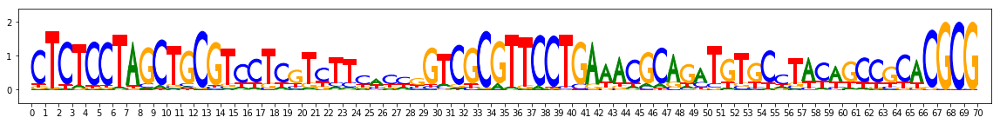

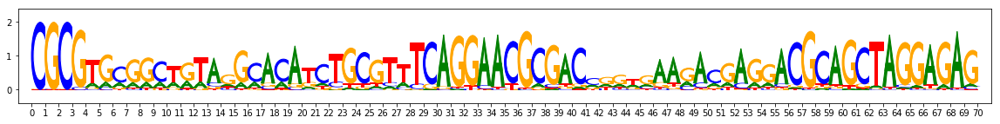

metacluster_0 pattern_1
Task 0 hypothetical scores:


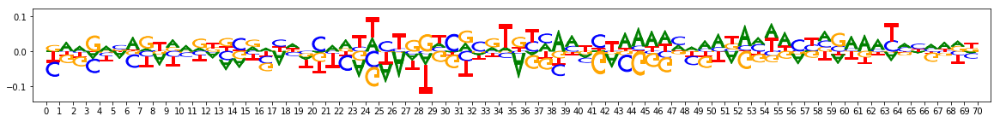

Task 0 actual importance scores:


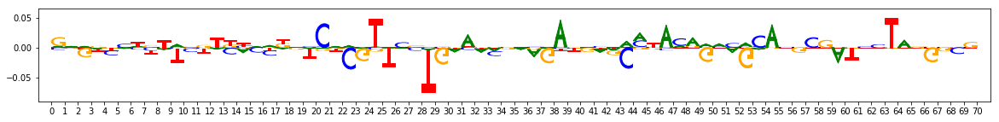

onehot, fwd and rev:


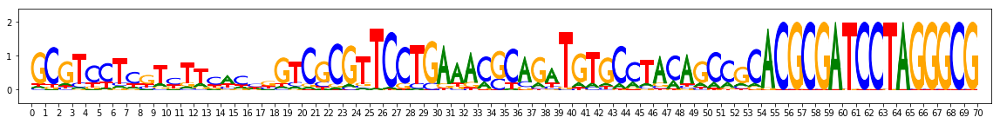

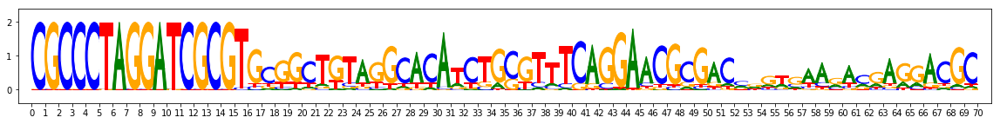

metacluster_0 pattern_2
Task 0 hypothetical scores:


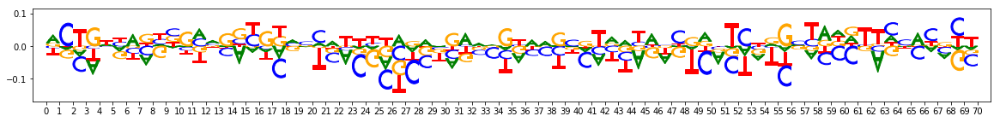

Task 0 actual importance scores:


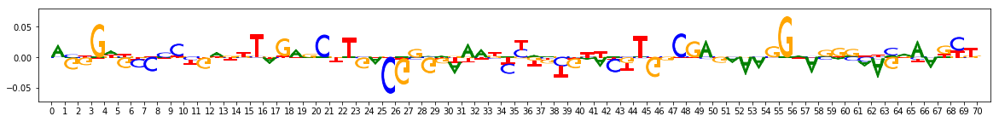

onehot, fwd and rev:


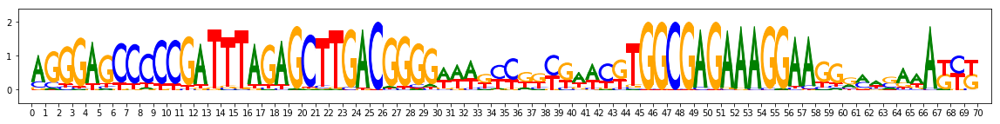

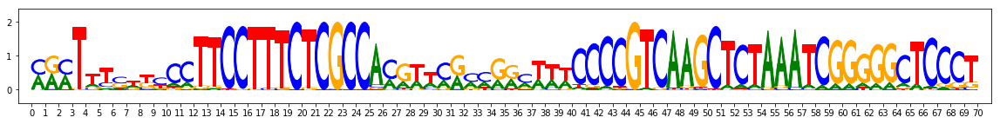

metacluster_0 pattern_3
Task 0 hypothetical scores:


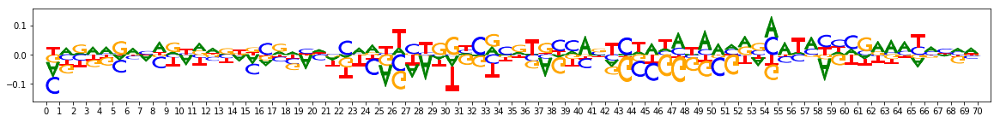

Task 0 actual importance scores:


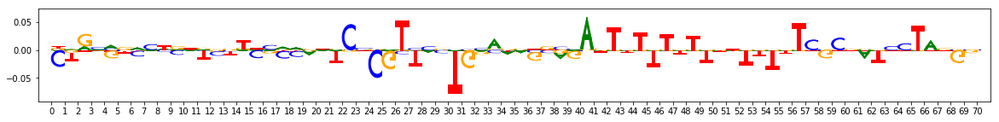

onehot, fwd and rev:


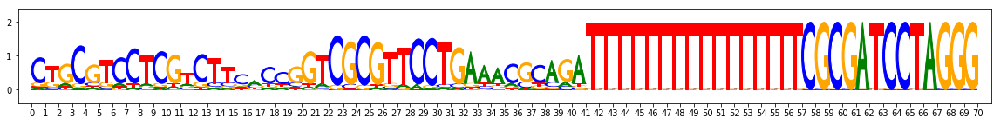

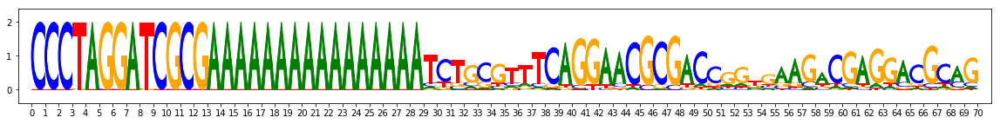

metacluster_1
activity pattern: [1]
No motifs found for this activity pattern


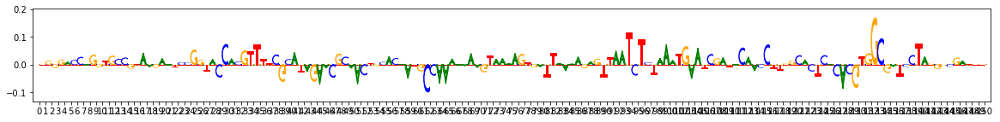

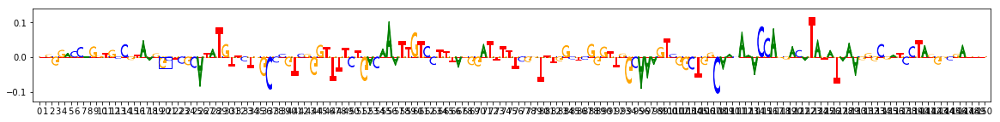

0: ACA


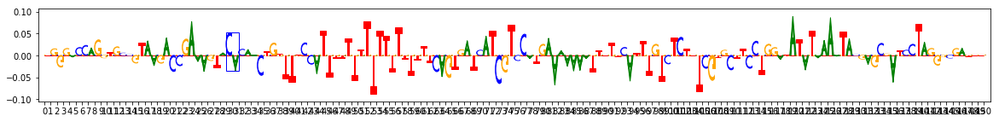

0: TAG


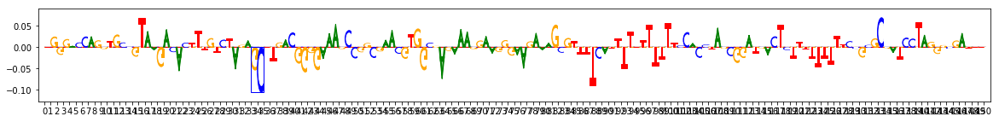

0: GCT


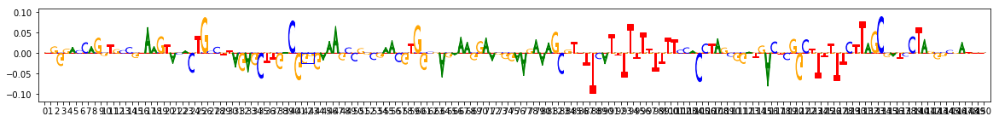

0: GGG


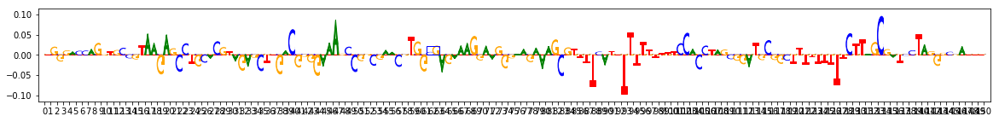

0: CGA


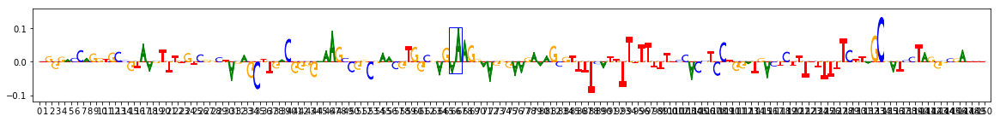

0: AAA


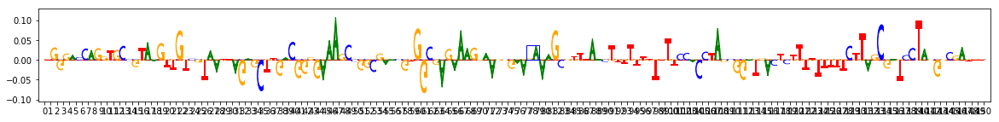

0: GAA


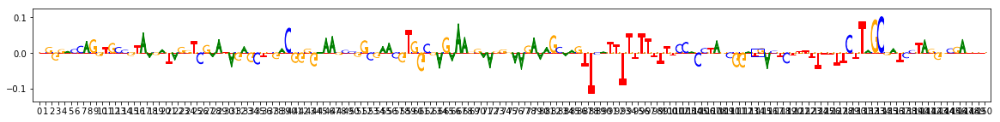

0: TGA


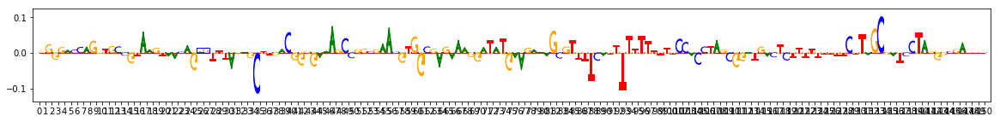

0: ACG


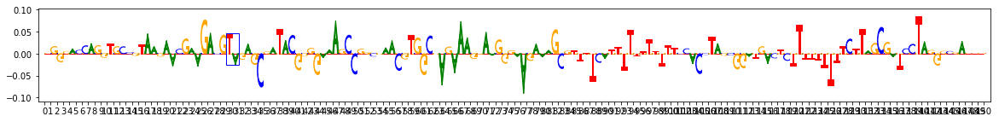

0: CGG


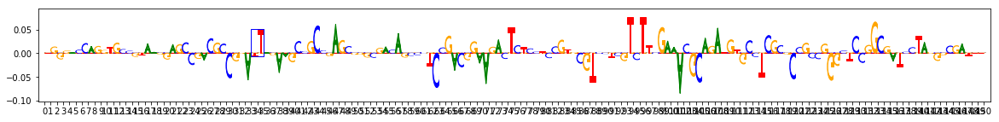

0: TTA


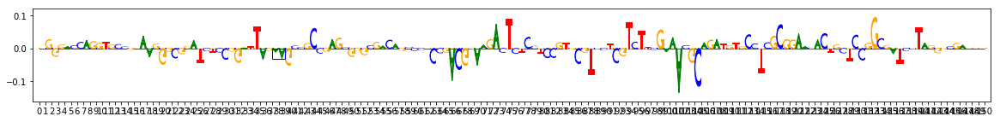

0: AAG


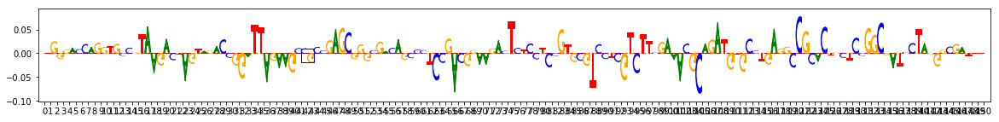

0: CGC


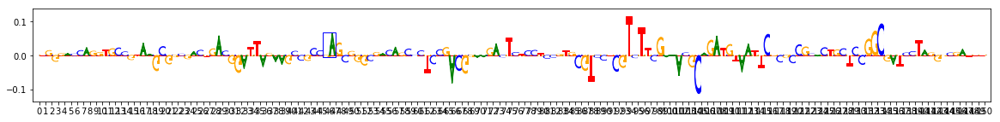

0: GAG


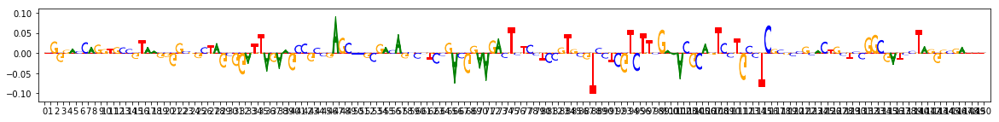

0: GGG


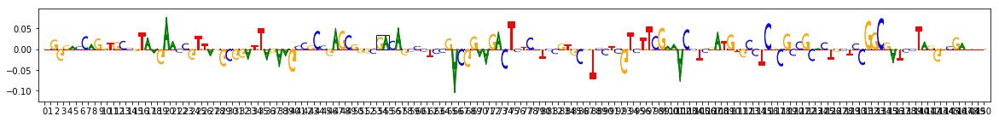

0: GAC


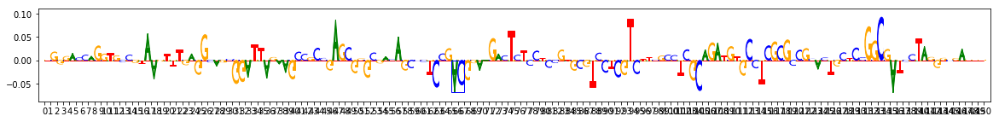

0: ACG


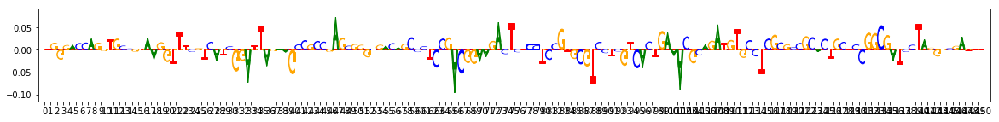

0: CCT


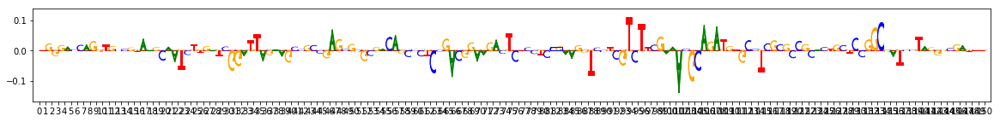

0: CGT


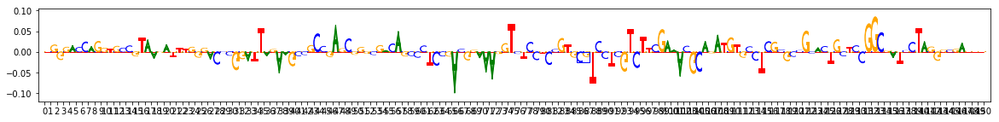

0: CGT
On task task0
Computing windowed sums on original
Generating null dist
peak(mu)= -0.004155470173282026
Computing threshold
Thresholds from null dist were -0.9024380881222896  and  0.7796738569159062
Passing windows frac was 0.00038389558040213064 , which is below  0.03 ; adjusting
Final raw thresholds are -0.3190666938328646  and  0.3190666938328646
Final transformed thresholds are -0.9699985603915735  and  0.9699985603915735


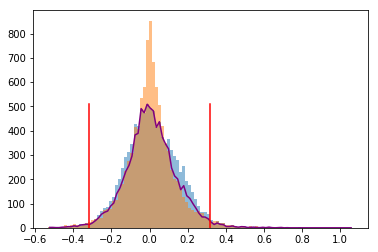

Got 2395 coords
After resolving overlaps, got 2395 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9699984603915736
2395 identified in total
2 activity patterns with support >= 100 out of 3 possible patterns
Metacluster sizes:  [1331, 1064]
Idx to activities:  {0: '-1', 1: '1'}
On metacluster 1
Metacluster size 1064
Relevant tasks:  ('task0',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 1064
(Round 1) Computing coarse affmat
Beginning embedding computation
Computing embeddings
Finished embedding computation in 13.18 s
Starting affinity matrix computations
Normalization computed in 0.2 s
Cosine similarity mat computed in 0.5 s
Normalization computed in 0.18 s
Cosine similarity mat computed in 0.48 s
Finished affinity matrix computations in 1.0 s
(Round 1) Compute nearest neighbors from coarse affmat
Computed nearest neighbors in 0.05 s
(Round 1) Computing affinity matrix on nearest neighbors
Launching nearest neighbor

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.0s finished


Louvain completed 200 runs in 2.342303514480591 seconds
Wrote graph to binary file in 0.27277350425720215 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.785872
After 3 runs, maximum modularity is Q = 0.789259
Louvain completed 53 runs in 3.575986385345459 seconds
Preproc + Louvain took 6.37615704536438 s
Got 14 clusters after round 1
Counts:
{2: 82, 10: 24, 7: 56, 5: 65, 13: 11, 1: 115, 4: 72, 6: 58, 3: 79, 0: 176, 12: 11, 11: 23, 9: 42, 8: 49}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 176 seqlets
Trimmed 24 out of 176
Skipped 1 seqlets
Aggregating for cluster 1 with 115 seqlets
Trimmed 17 out of 115
Skipped 98 seqlets
Aggregating for cluster 2 with 82 seqlets
Trimmed 5 out of 82
Skipped 2 seqlets
Aggregating for cluster 3 with 79 seqlets
Trimmed 15 out of 79
Skipped 64 seqlets
Aggregating for cluster 4 with 72 seqlets
Trimmed 5 out of 72
Skipped 67 seqlets
Aggregating for cluster 5 with 65 seqlets
Trimmed 15

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.501143455505371 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.4s finished


Wrote graph to binary file in 0.07079792022705078 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.754538
Louvain completed 51 runs in 3.012746572494507 seconds
Preproc + Louvain took 4.67110013961792 s
Got 9 clusters after round 2
Counts:
{6: 26, 2: 49, 4: 28, 0: 59, 5: 27, 3: 36, 7: 12, 1: 52, 8: 10}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 59 seqlets
Trimmed 2 out of 59
Skipped 57 seqlets
Aggregating for cluster 1 with 52 seqlets
Trimmed 2 out of 52
Aggregating for cluster 2 with 49 seqlets
Trimmed 3 out of 49
Skipped 46 seqlets
Aggregating for cluster 3 with 36 seqlets
Trimmed 1 out of 36
Skipped 35 seqlets
Aggregating for cluster 4 with 28 seqlets
Trimmed 2 out of 28
Skipped 26 seqlets
Aggregating for cluster 5 with 27 seqlets
Trimmed 1 out of 27
Skipped 26 seqlets
Aggregating for cluster 6 with 26 seqlets
Trimmed 5 out of 26
Skipped 21 seqlets
Aggregating for cluster 7 with 12 seqlets
Trimmed 2 out of 12

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.2s finished


Louvain completed 200 runs in 2.674955129623413 seconds
Wrote graph to binary file in 0.6647493839263916 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.854879
After 7 runs, maximum modularity is Q = 0.857623
After 54 runs, maximum modularity is Q = 0.859819
Louvain completed 104 runs in 7.101572751998901 seconds
Preproc + Louvain took 10.74271035194397 s
Got 16 clusters after round 1
Counts:
{4: 86, 0: 167, 5: 79, 1: 109, 9: 64, 3: 96, 7: 67, 14: 14, 8: 66, 2: 107, 12: 20, 11: 27, 13: 16, 10: 56, 6: 76, 15: 6}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 167 seqlets
Trimmed 30 out of 167
Aggregating for cluster 1 with 109 seqlets
Trimmed 17 out of 109
Skipped 92 seqlets
Aggregating for cluster 2 with 107 seqlets
Trimmed 14 out of 107
Aggregating for cluster 3 with 96 seqlets
Trimmed 18 out of 96
Skipped 78 seqlets
Aggregating for cluster 4 with 86 seqlets
Trimmed 16 out of 86
Aggregating for cluster 5 with 79 se

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.7897067070007324 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.6s finished


Wrote graph to binary file in 0.18823742866516113 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.782026
Louvain completed 51 runs in 3.300278663635254 seconds
Preproc + Louvain took 5.448359251022339 s
Got 11 clusters after round 2
Counts:
{10: 7, 0: 128, 8: 14, 4: 60, 1: 106, 7: 15, 2: 94, 5: 46, 6: 16, 3: 80, 9: 9}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 128 seqlets
Trimmed 1 out of 128
Dropping cluster 0 with 127 seqlets due to sign disagreement
Aggregating for cluster 1 with 106 seqlets
Trimmed 1 out of 106
Skipped 105 seqlets
Aggregating for cluster 2 with 94 seqlets
Trimmed 0 out of 94
Aggregating for cluster 3 with 80 seqlets
Trimmed 2 out of 80
Skipped 78 seqlets
Aggregating for cluster 4 with 60 seqlets
Trimmed 1 out of 60
Dropping cluster 4 with 59 seqlets due to sign disagreement
Aggregating for cluster 5 with 46 seqlets
Trimmed 0 out of 46
Aggregating for cluster 6 with 16 seqlets
Trimmed 0 out 

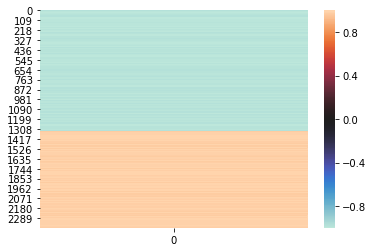

metacluster_0
activity pattern: [-1]
metacluster_0 pattern_0
Task 0 hypothetical scores:


/home/ryan/anaconda3/envs/genomics/lib/python3.6/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


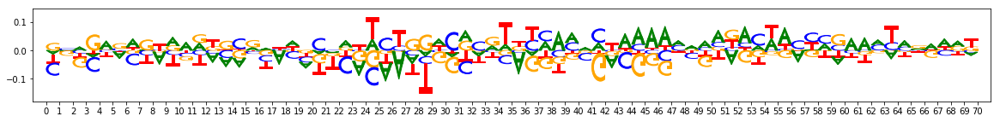

Task 0 actual importance scores:


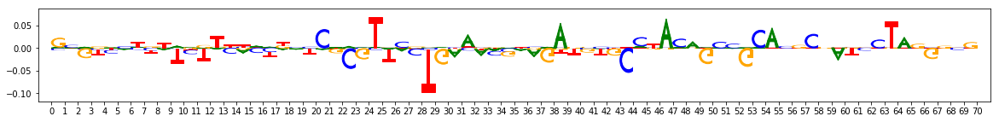

onehot, fwd and rev:


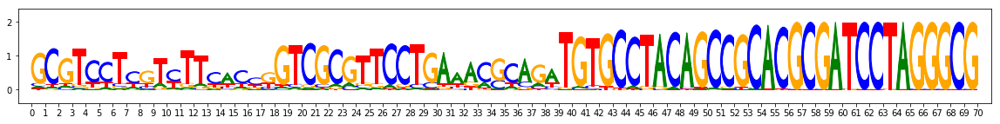

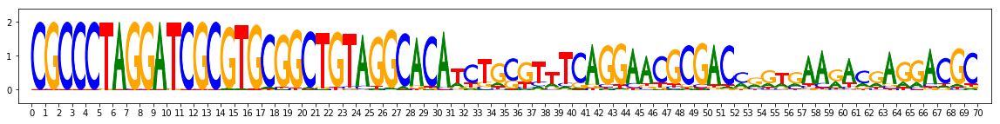

metacluster_0 pattern_1
Task 0 hypothetical scores:


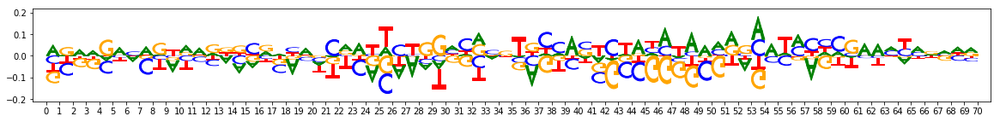

Task 0 actual importance scores:


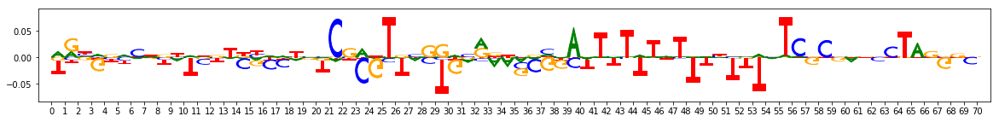

onehot, fwd and rev:


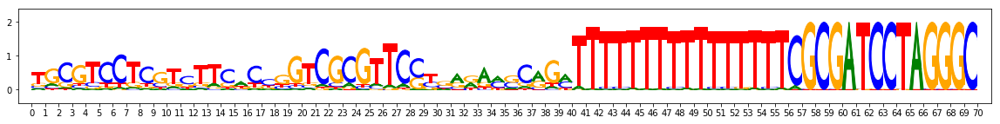

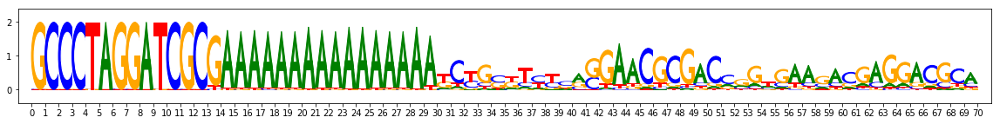

metacluster_1
activity pattern: [1]
metacluster_1 pattern_0
Task 0 hypothetical scores:


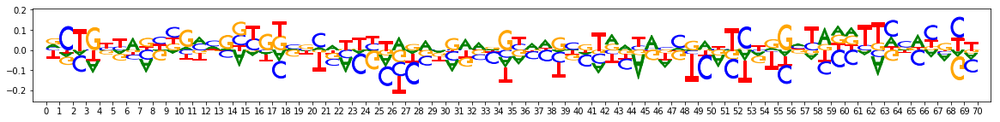

Task 0 actual importance scores:


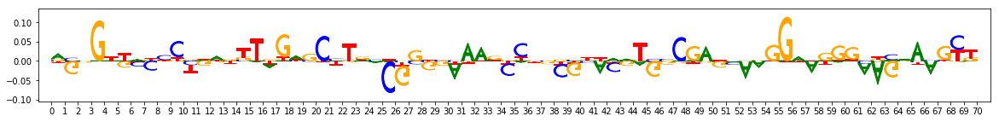

onehot, fwd and rev:


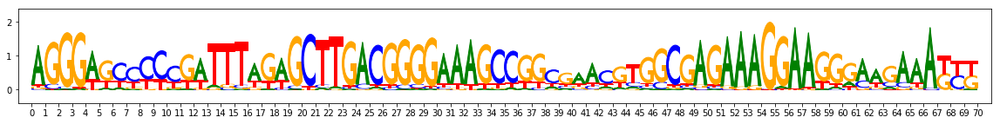

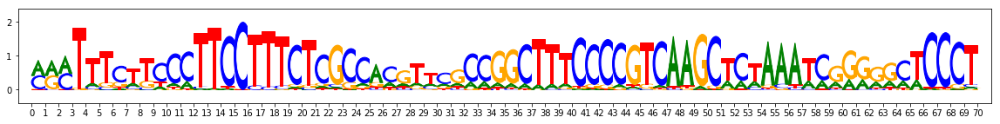

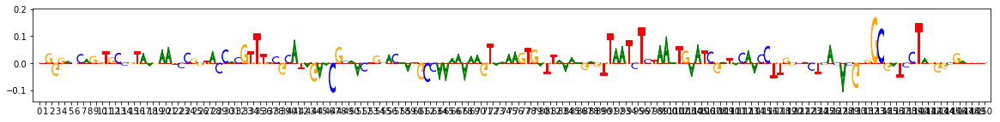

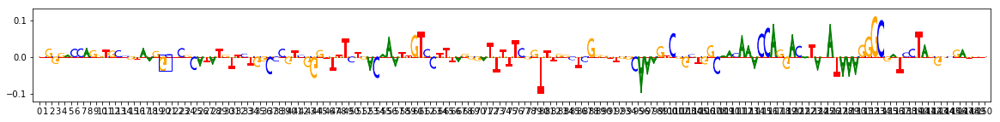

0: ACA


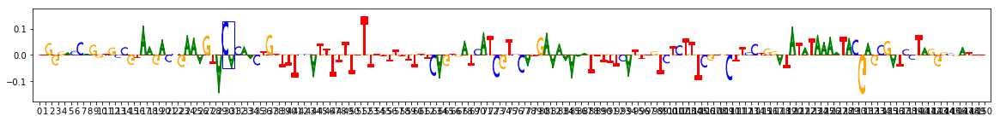

0: TAG


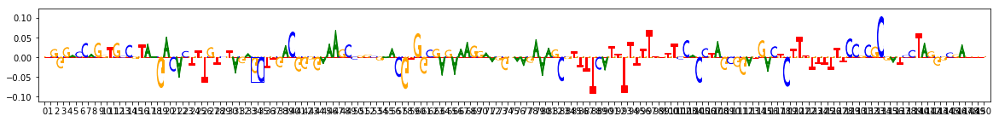

0: GCT


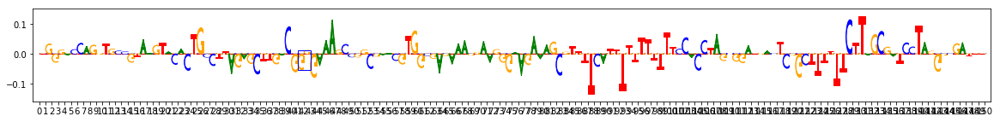

0: GGG


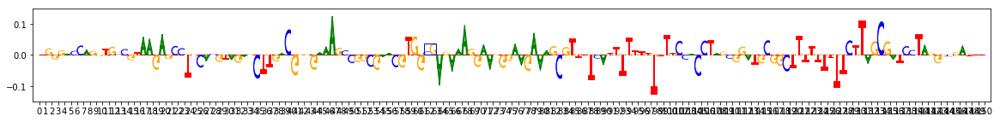

0: CGA


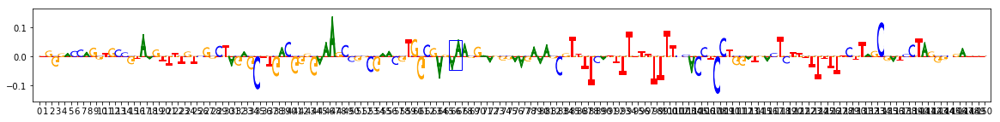

0: AAA


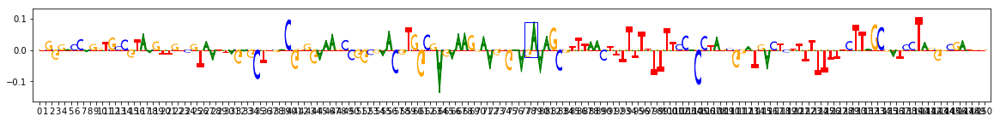

0: GAA


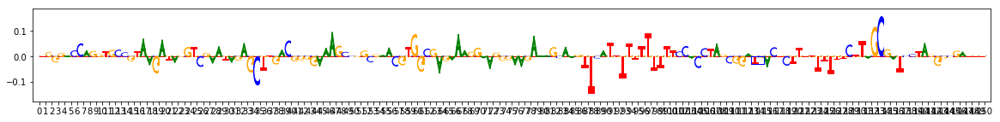

0: TGA


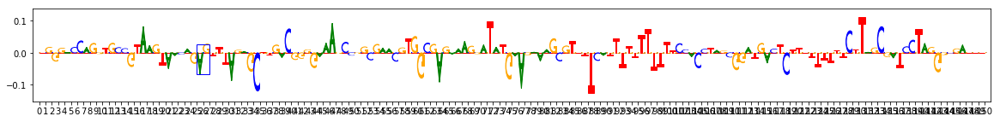

0: ACG


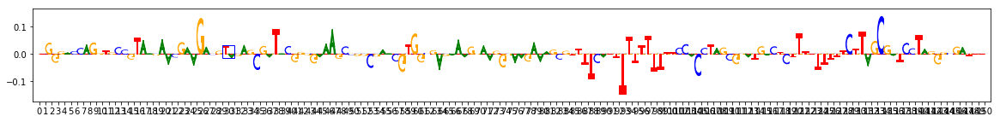

0: CGG


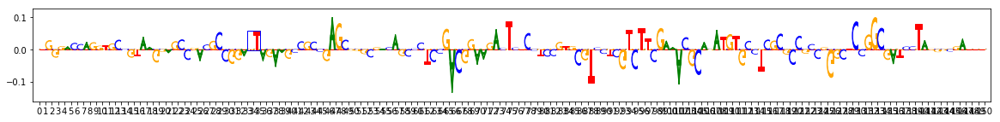

0: TTA


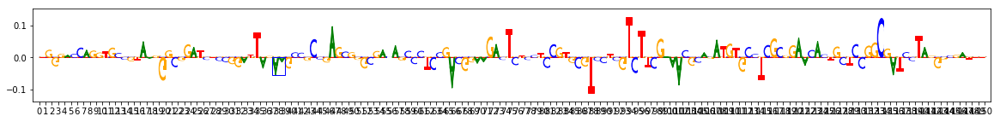

0: AAG


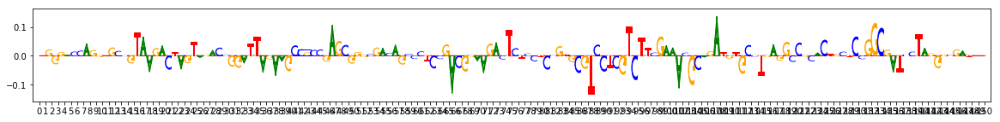

0: CGC


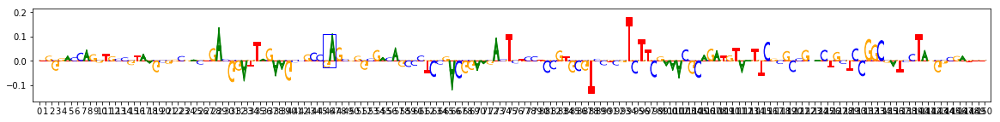

0: GAG


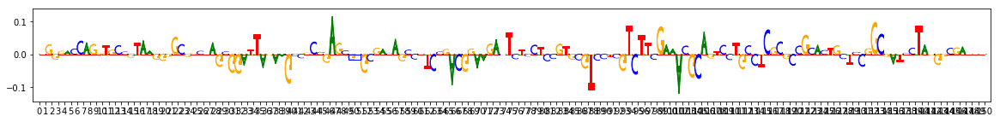

0: GGG


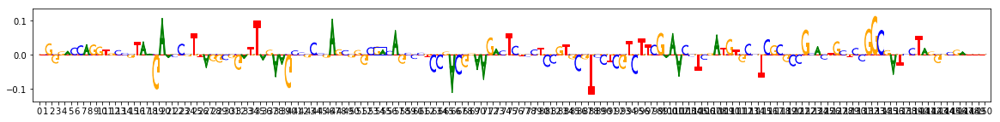

0: GAC


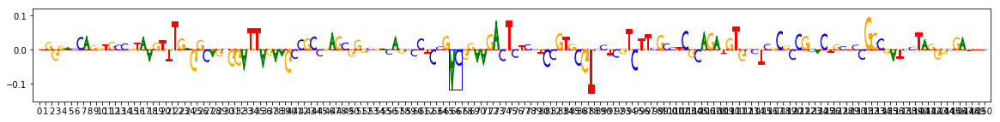

0: ACG


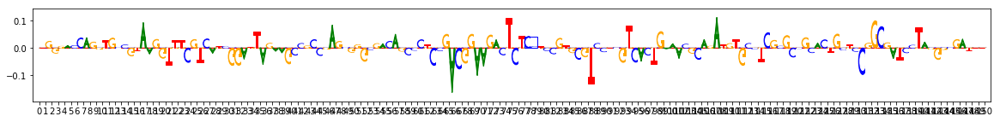

0: CCT


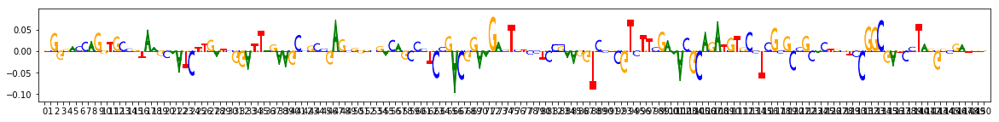

0: CGT


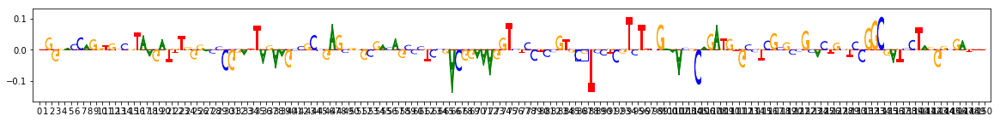

0: CGT
On task task0
Computing windowed sums on original
Generating null dist
peak(mu)= -0.03242808800057968
Computing threshold
Thresholds from null dist were -1.1550647734664379  and  0.9819197298958897
Passing windows frac was 0.0003247116784234688 , which is below  0.03 ; adjusting
Final raw thresholds are -0.39362488845933685  and  0.39362488845933685
Final transformed thresholds are -0.9699985603915735  and  0.9699985603915735


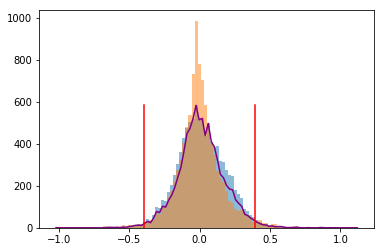

Got 2420 coords
After resolving overlaps, got 2420 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9699984603915736
2420 identified in total
2 activity patterns with support >= 100 out of 3 possible patterns
Metacluster sizes:  [1338, 1082]
Idx to activities:  {0: '-1', 1: '1'}
On metacluster 1
Metacluster size 1082
Relevant tasks:  ('task0',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 1082
(Round 1) Computing coarse affmat
Beginning embedding computation
Computing embeddings
Finished embedding computation in 13.41 s
Starting affinity matrix computations
Normalization computed in 0.2 s
Cosine similarity mat computed in 0.51 s
Normalization computed in 0.18 s
Cosine similarity mat computed in 0.49 s
Finished affinity matrix computations in 1.02 s
(Round 1) Compute nearest neighbors from coarse affmat
Computed nearest neighbors in 0.05 s
(Round 1) Computing affinity matrix on nearest neighbors
Launching nearest neighb

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.0s finished


Louvain completed 200 runs in 2.3927509784698486 seconds
Wrote graph to binary file in 0.2635211944580078 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.800102
Louvain completed 51 runs in 3.5520143508911133 seconds
Preproc + Louvain took 6.3855602741241455 s
Got 14 clusters after round 1
Counts:
{3: 78, 0: 155, 13: 8, 9: 48, 1: 110, 2: 80, 6: 56, 10: 25, 11: 23, 5: 69, 4: 74, 7: 53, 8: 49, 12: 11}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 155 seqlets
Trimmed 29 out of 155
Aggregating for cluster 1 with 110 seqlets
Trimmed 19 out of 110
Skipped 91 seqlets
Aggregating for cluster 2 with 80 seqlets
Trimmed 32 out of 80
Aggregating for cluster 3 with 78 seqlets
Trimmed 2 out of 78
Aggregating for cluster 4 with 74 seqlets
Trimmed 8 out of 74
Skipped 66 seqlets
Aggregating for cluster 5 with 69 seqlets
Trimmed 3 out of 69
Skipped 66 seqlets
Aggregating for cluster 6 with 56 seqlets
Trimmed 2 out of 56
Skipped 54 

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.4268250465393066 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.3s finished


Wrote graph to binary file in 0.09042835235595703 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.693373
Louvain completed 51 runs in 3.2985711097717285 seconds
Preproc + Louvain took 4.897081136703491 s
Got 8 clusters after round 2
Counts:
{0: 72, 1: 57, 3: 46, 5: 19, 2: 50, 4: 26, 6: 11, 7: 8}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 72 seqlets
Trimmed 3 out of 72
Skipped 69 seqlets
Aggregating for cluster 1 with 57 seqlets
Trimmed 0 out of 57
Skipped 57 seqlets
Aggregating for cluster 2 with 50 seqlets
Trimmed 0 out of 50
Skipped 50 seqlets
Aggregating for cluster 3 with 46 seqlets
Trimmed 0 out of 46
Aggregating for cluster 4 with 26 seqlets
Trimmed 0 out of 26
Skipped 26 seqlets
Aggregating for cluster 5 with 19 seqlets
Trimmed 1 out of 19
Aggregating for cluster 6 with 11 seqlets
Trimmed 0 out of 11
Aggregating for cluster 7 with 8 seqlets
Trimmed 0 out of 8
Got 4 clusters
Splitting into subclusters...


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.2s finished


Louvain completed 200 runs in 2.6817421913146973 seconds
Wrote graph to binary file in 0.7144994735717773 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.839805
After 46 runs, maximum modularity is Q = 0.840591
After 69 runs, maximum modularity is Q = 0.840852
Louvain completed 119 runs in 8.619004726409912 seconds
Preproc + Louvain took 12.312912702560425 s
Got 18 clusters after round 1
Counts:
{0: 174, 10: 46, 6: 78, 9: 55, 5: 79, 2: 99, 7: 76, 3: 92, 15: 11, 13: 24, 14: 20, 8: 55, 1: 100, 11: 33, 12: 32, 17: 9, 4: 85, 16: 11}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 174 seqlets
Trimmed 63 out of 174
Aggregating for cluster 1 with 100 seqlets
Trimmed 33 out of 100
Aggregating for cluster 2 with 99 seqlets
Trimmed 8 out of 99
Aggregating for cluster 3 with 92 seqlets
Trimmed 16 out of 92
Aggregating for cluster 4 with 85 seqlets
Trimmed 1 out of 85
Skipped 84 seqlets
Aggregating for cluster 5 with 79 seqlets

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.8497843742370605 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.6s finished


Wrote graph to binary file in 0.18674063682556152 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.80751
After 2 runs, maximum modularity is Q = 0.829031
Louvain completed 52 runs in 3.6878035068511963 seconds
Preproc + Louvain took 5.866723537445068 s
Got 11 clusters after round 2
Counts:
{9: 14, 1: 97, 3: 69, 0: 119, 7: 25, 2: 89, 5: 61, 4: 67, 8: 17, 6: 29, 10: 11}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 119 seqlets
Trimmed 0 out of 119
Aggregating for cluster 1 with 97 seqlets
Trimmed 0 out of 97
Dropping cluster 1 with 97 seqlets due to sign disagreement
Aggregating for cluster 2 with 89 seqlets
Trimmed 3 out of 89
Skipped 86 seqlets
Aggregating for cluster 3 with 69 seqlets
Trimmed 2 out of 69
Skipped 67 seqlets
Aggregating for cluster 4 with 67 seqlets
Trimmed 0 out of 67
Aggregating for cluster 5 with 61 seqlets
Trimmed 0 out of 61
Aggregating for cluster 6 with 29 seqlets
Trimmed 0 out of 29
Skipped 

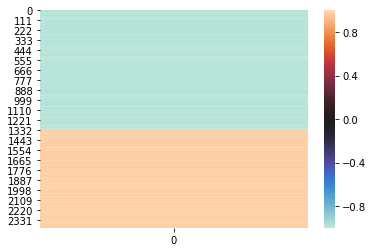

metacluster_0
activity pattern: [-1]
metacluster_0 pattern_0
Task 0 hypothetical scores:


/home/ryan/anaconda3/envs/genomics/lib/python3.6/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


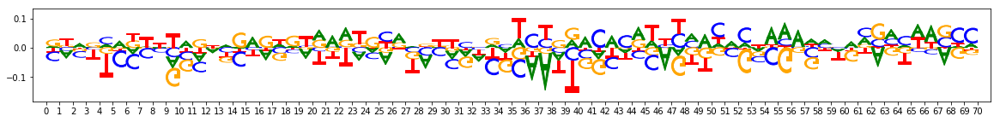

Task 0 actual importance scores:


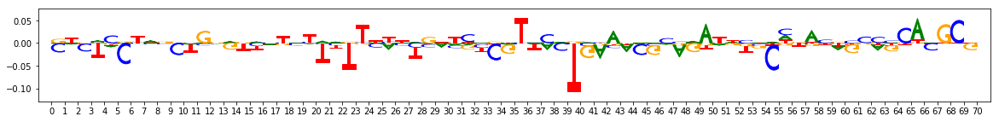

onehot, fwd and rev:


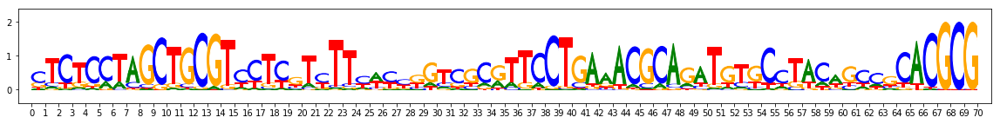

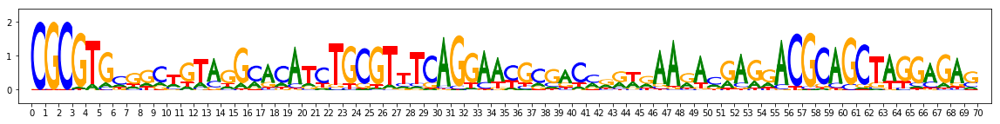

metacluster_0 pattern_1
Task 0 hypothetical scores:


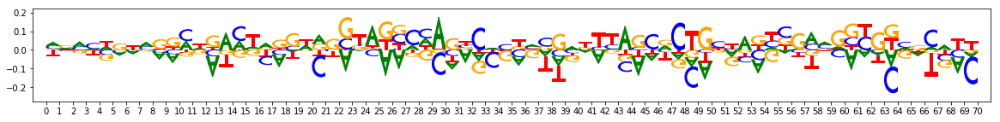

Task 0 actual importance scores:


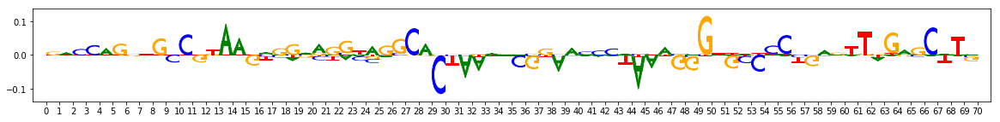

onehot, fwd and rev:


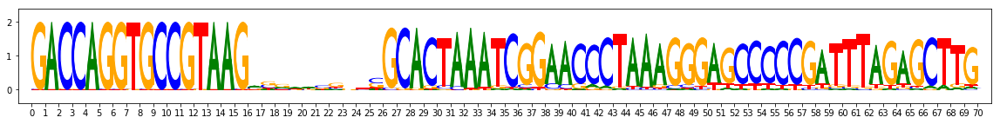

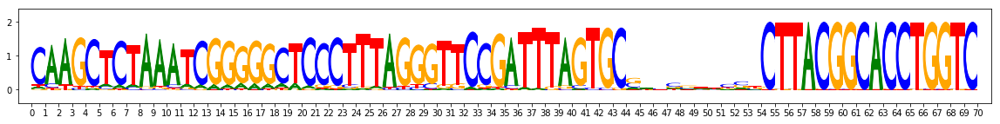

metacluster_0 pattern_2
Task 0 hypothetical scores:


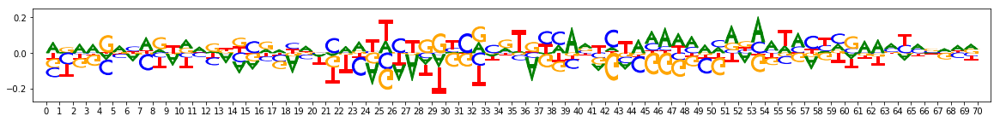

Task 0 actual importance scores:


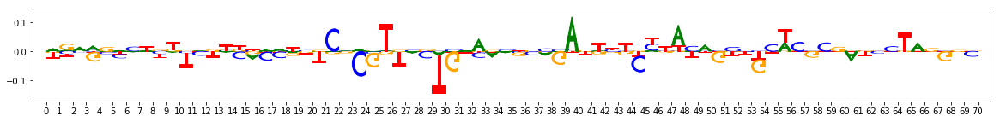

onehot, fwd and rev:


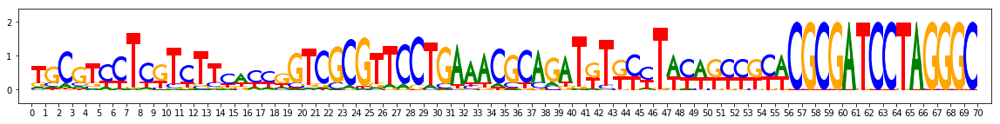

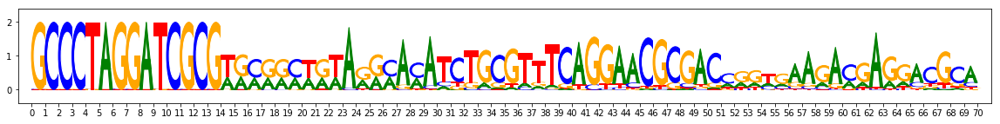

metacluster_0 pattern_3
Task 0 hypothetical scores:


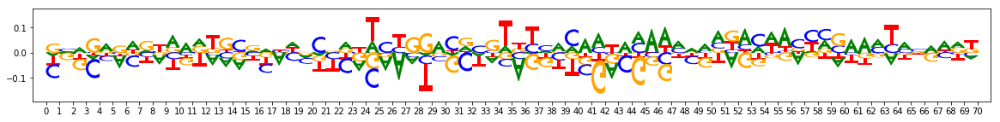

Task 0 actual importance scores:


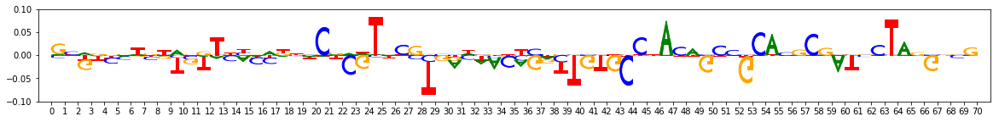

onehot, fwd and rev:


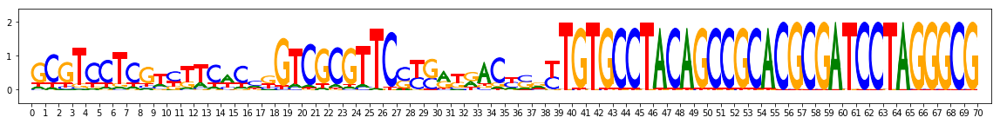

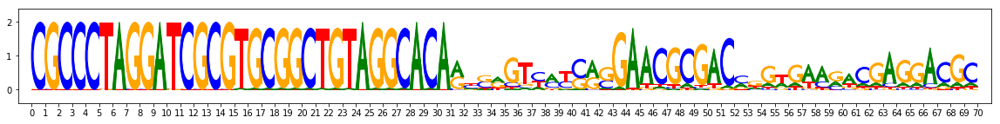

metacluster_0 pattern_4
Task 0 hypothetical scores:


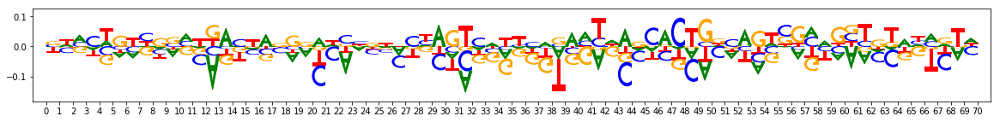

Task 0 actual importance scores:


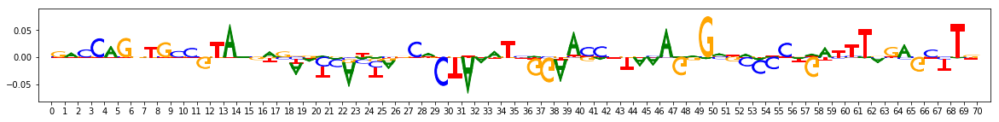

onehot, fwd and rev:


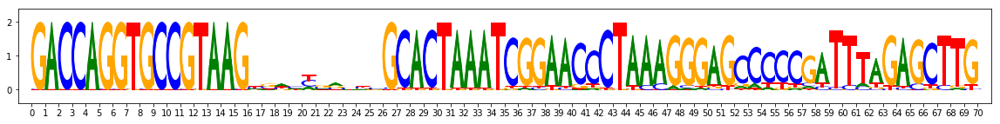

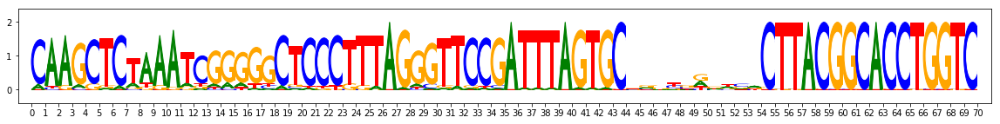

metacluster_1
activity pattern: [1]
metacluster_1 pattern_0
Task 0 hypothetical scores:


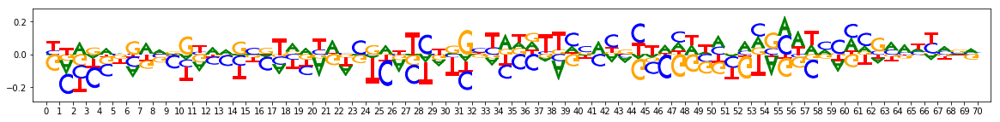

Task 0 actual importance scores:


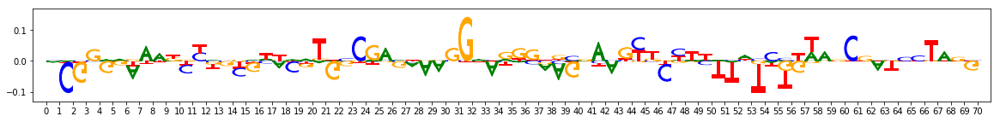

onehot, fwd and rev:


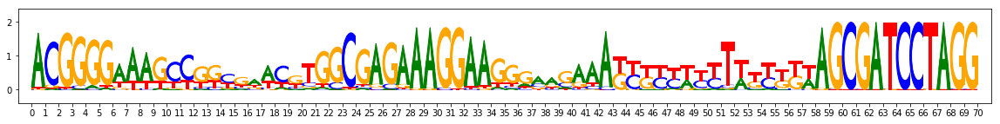

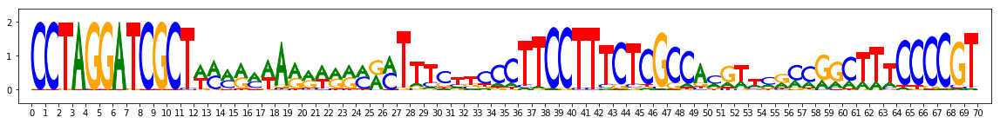

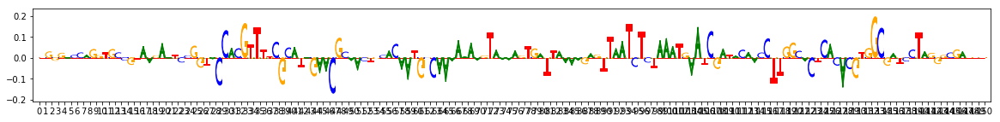

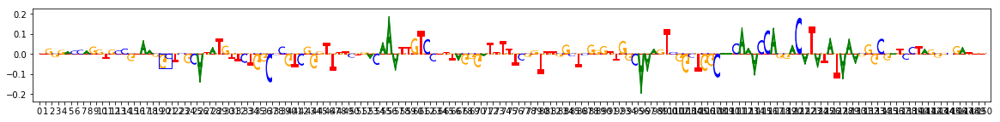

0: ACA


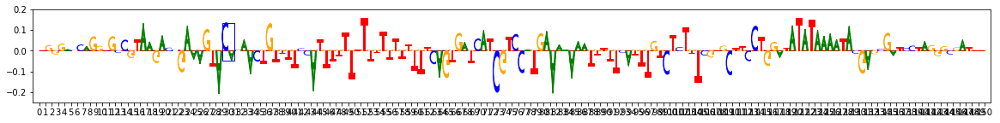

0: TAG


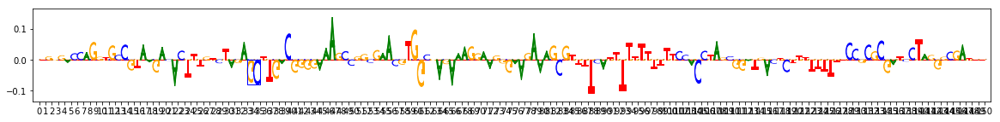

0: GCT


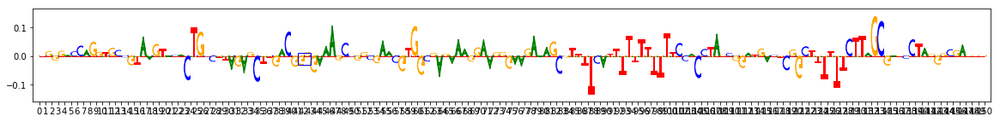

0: GGG


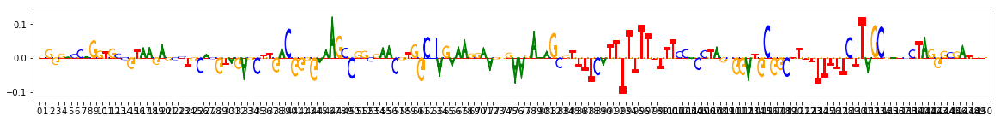

0: CGA


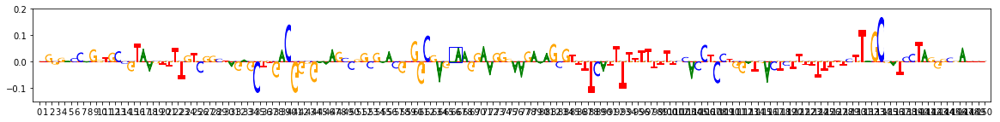

0: AAA


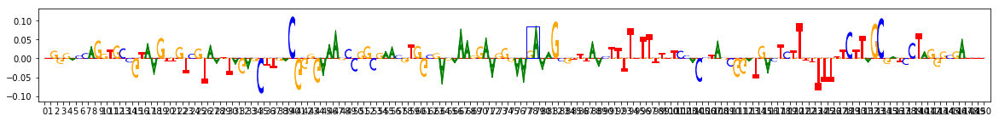

0: GAA


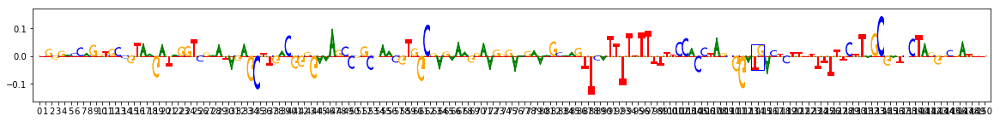

0: TGA


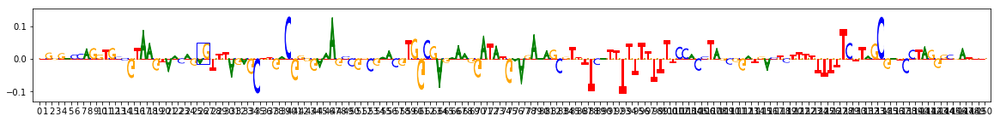

0: ACG


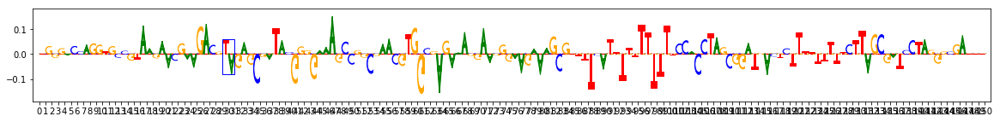

0: CGG


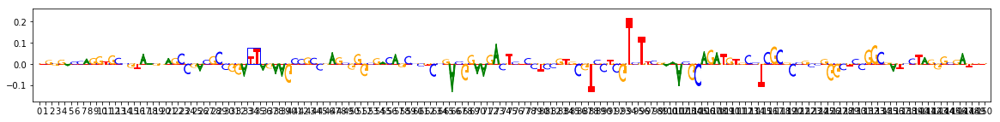

0: TTA


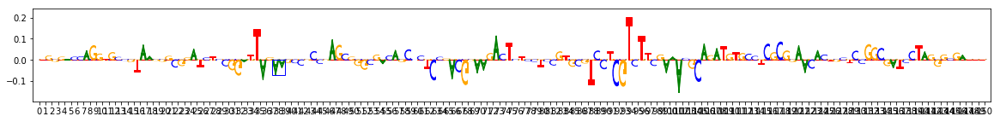

0: AAG


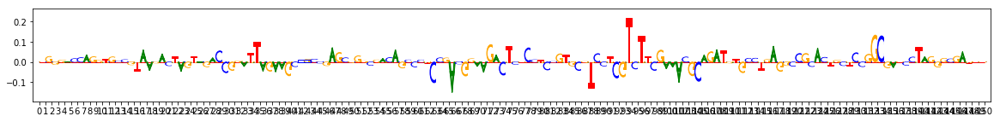

0: CGC


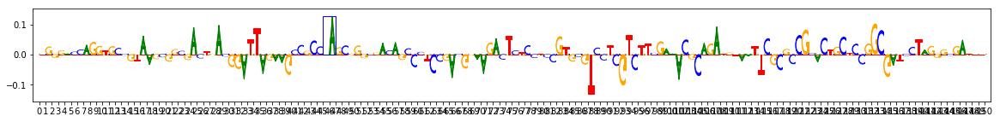

0: GAG


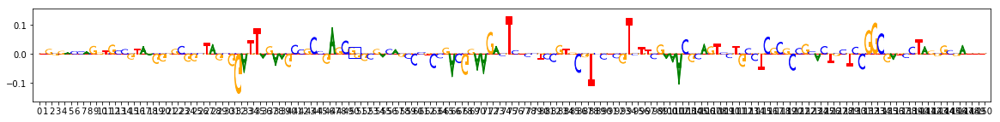

0: GGG


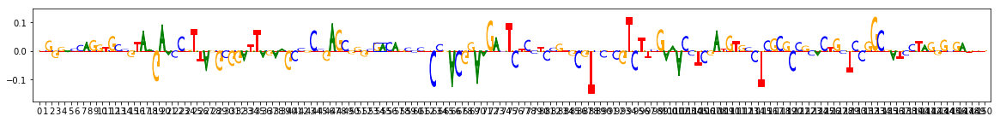

0: GAC


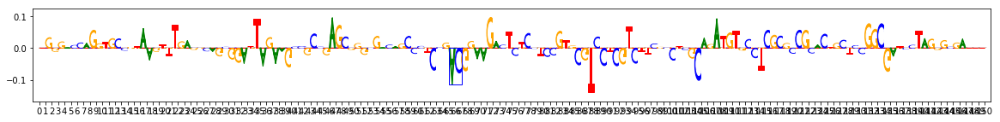

0: ACG


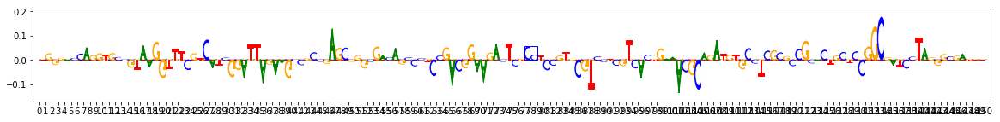

0: CCT


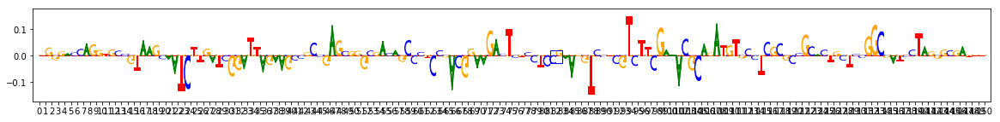

0: CGT


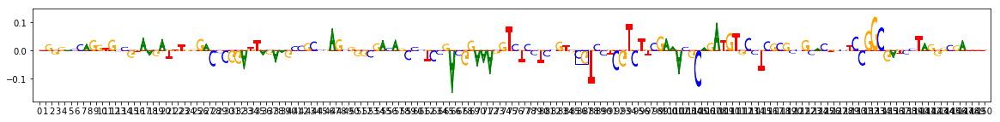

0: CGT
On task task0
Computing windowed sums on original
Generating null dist
peak(mu)= -0.021528438331023705
Computing threshold
Thresholds from null dist were -1.623611604538746  and  1.2031099159270524
Passing windows frac was 0.00027032647119983364 , which is below  0.03 ; adjusting
Final raw thresholds are -0.4796429620988778  and  0.4796429620988778
Final transformed thresholds are -0.9699985603915735  and  0.9699985603915735


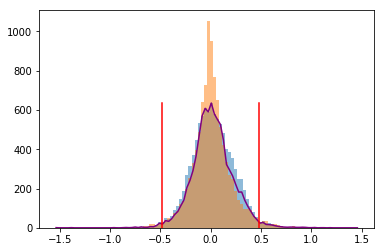

Got 2199 coords
After resolving overlaps, got 2199 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9699984603915736
2199 identified in total
2 activity patterns with support >= 100 out of 3 possible patterns
Metacluster sizes:  [1184, 1015]
Idx to activities:  {0: '-1', 1: '1'}
On metacluster 1
Metacluster size 1015
Relevant tasks:  ('task0',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 1015
(Round 1) Computing coarse affmat
Beginning embedding computation
Computing embeddings
Finished embedding computation in 12.65 s
Starting affinity matrix computations
Normalization computed in 0.19 s
Cosine similarity mat computed in 0.47 s
Normalization computed in 0.29 s
Cosine similarity mat computed in 0.57 s
Finished affinity matrix computations in 1.06 s
(Round 1) Compute nearest neighbors from coarse affmat
Computed nearest neighbors in 0.05 s
(Round 1) Computing affinity matrix on nearest neighbors
Launching nearest neigh

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.9s finished


Louvain completed 200 runs in 2.2546303272247314 seconds
Wrote graph to binary file in 0.24791407585144043 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.777875
After 7 runs, maximum modularity is Q = 0.781959
Louvain completed 57 runs in 4.151814222335815 seconds
Preproc + Louvain took 6.842576026916504 s
Got 14 clusters after round 1
Counts:
{2: 110, 13: 14, 6: 57, 1: 113, 5: 58, 12: 14, 10: 23, 3: 75, 0: 156, 9: 26, 4: 71, 7: 48, 11: 15, 8: 26}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 156 seqlets
Trimmed 22 out of 156
Aggregating for cluster 1 with 113 seqlets
Trimmed 12 out of 113
Skipped 101 seqlets
Aggregating for cluster 2 with 110 seqlets
Trimmed 7 out of 110
Skipped 103 seqlets
Aggregating for cluster 3 with 75 seqlets
Trimmed 16 out of 75
Aggregating for cluster 4 with 71 seqlets
Trimmed 4 out of 71
Skipped 67 seqlets
Aggregating for cluster 5 with 58 seqlets
Trimmed 5 out of 58
Skipped 53 seqlets


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.4765291213989258 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.3s finished


Wrote graph to binary file in 0.10306024551391602 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.500216
Louvain completed 51 runs in 3.599541187286377 seconds
Preproc + Louvain took 5.29518985748291 s
Got 11 clusters after round 2
Counts:
{0: 80, 1: 46, 7: 16, 9: 10, 10: 5, 4: 26, 3: 30, 6: 18, 5: 19, 2: 33, 8: 13}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 80 seqlets
Trimmed 9 out of 80
Skipped 71 seqlets
Aggregating for cluster 1 with 46 seqlets
Trimmed 4 out of 46
Skipped 42 seqlets
Aggregating for cluster 2 with 33 seqlets
Trimmed 0 out of 33
Skipped 33 seqlets
Aggregating for cluster 3 with 30 seqlets
Trimmed 0 out of 30
Aggregating for cluster 4 with 26 seqlets
Trimmed 0 out of 26
Aggregating for cluster 5 with 19 seqlets
Trimmed 0 out of 19
Skipped 19 seqlets
Aggregating for cluster 6 with 18 seqlets
Trimmed 0 out of 18
Dropping cluster 6 with 18 seqlets due to sign disagreement
Aggregating for cluster 

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.0s finished


Louvain completed 200 runs in 2.4217336177825928 seconds
Wrote graph to binary file in 0.3841063976287842 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.822095
After 26 runs, maximum modularity is Q = 0.828828
Louvain completed 76 runs in 5.84719705581665 seconds
Preproc + Louvain took 8.86556887626648 s
Got 13 clusters after round 1
Counts:
{4: 85, 7: 60, 8: 53, 3: 94, 0: 179, 1: 115, 2: 96, 9: 38, 6: 74, 11: 21, 10: 30, 12: 11, 5: 74}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 179 seqlets
Trimmed 35 out of 179
Aggregating for cluster 1 with 115 seqlets
Trimmed 20 out of 115
Aggregating for cluster 2 with 96 seqlets
Trimmed 23 out of 96
Aggregating for cluster 3 with 94 seqlets
Trimmed 5 out of 94
Skipped 89 seqlets
Aggregating for cluster 4 with 85 seqlets
Trimmed 20 out of 85
Aggregating for cluster 5 with 74 seqlets
Trimmed 3 out of 74
Skipped 71 seqlets
Aggregating for cluster 6 with 74 seqlets
Trimmed 5 

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.7804152965545654 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.6s finished


Wrote graph to binary file in 0.11675238609313965 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.829038
After 8 runs, maximum modularity is Q = 0.833213
Louvain completed 58 runs in 4.2726263999938965 seconds
Preproc + Louvain took 6.317358493804932 s
Got 10 clusters after round 2
Counts:
{5: 49, 6: 48, 4: 53, 9: 10, 1: 76, 2: 75, 0: 94, 3: 67, 7: 35, 8: 10}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 94 seqlets
Trimmed 11 out of 94
Skipped 83 seqlets
Aggregating for cluster 1 with 76 seqlets
Trimmed 6 out of 76
Dropping cluster 1 with 70 seqlets due to sign disagreement
Aggregating for cluster 2 with 75 seqlets
Trimmed 1 out of 75
Dropping cluster 2 with 74 seqlets due to sign disagreement
Aggregating for cluster 3 with 67 seqlets
Trimmed 1 out of 67
Skipped 66 seqlets
Aggregating for cluster 4 with 53 seqlets
Trimmed 3 out of 53
Aggregating for cluster 5 with 49 seqlets
Trimmed 0 out of 49
Skipped 49 seqlets


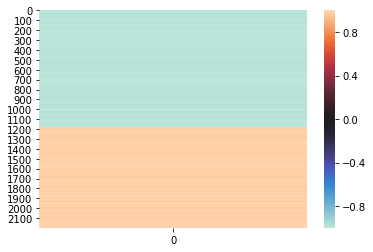

metacluster_0
activity pattern: [-1]
metacluster_0 pattern_0
Task 0 hypothetical scores:


/home/ryan/anaconda3/envs/genomics/lib/python3.6/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


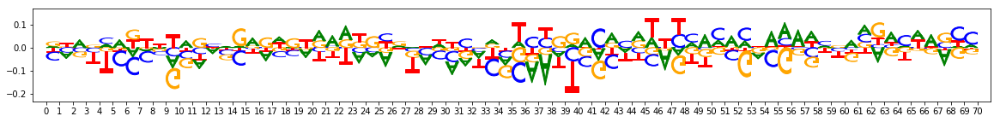

Task 0 actual importance scores:


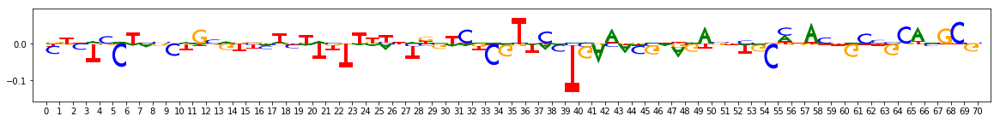

onehot, fwd and rev:


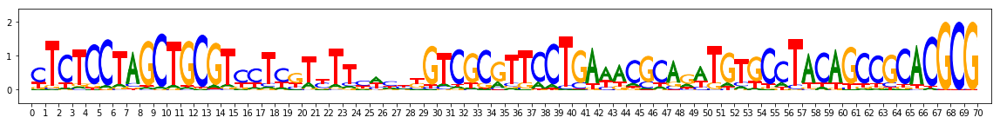

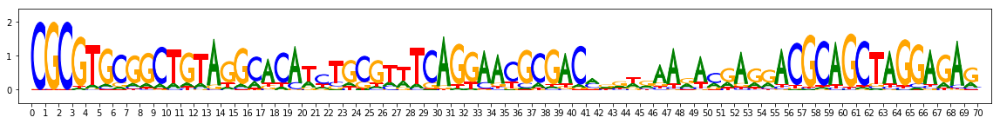

metacluster_0 pattern_1
Task 0 hypothetical scores:


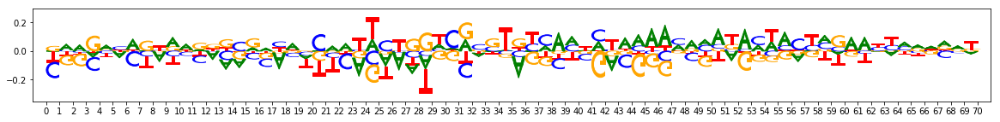

Task 0 actual importance scores:


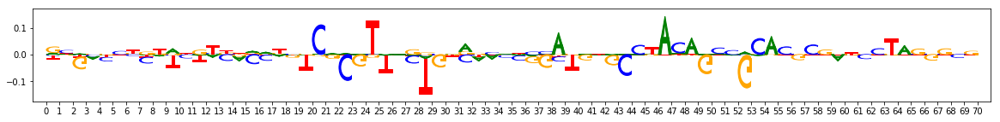

onehot, fwd and rev:


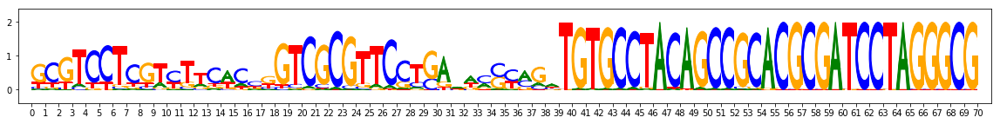

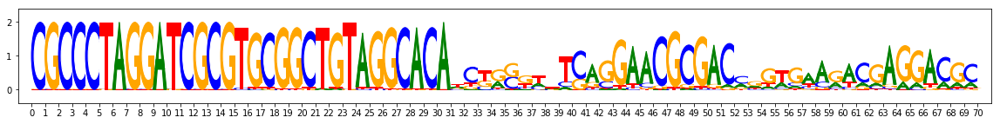

metacluster_0 pattern_2
Task 0 hypothetical scores:


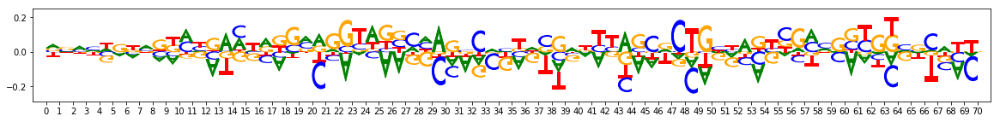

Task 0 actual importance scores:


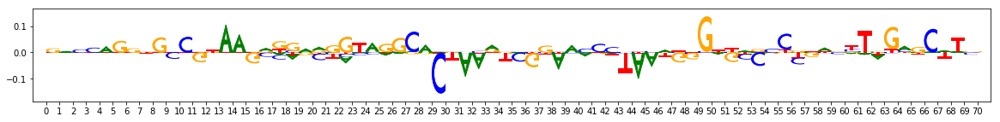

onehot, fwd and rev:


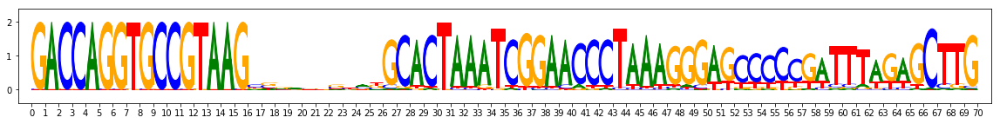

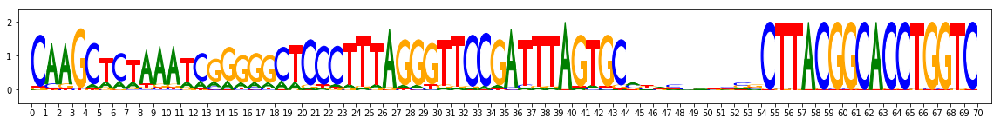

metacluster_1
activity pattern: [1]
No motifs found for this activity pattern


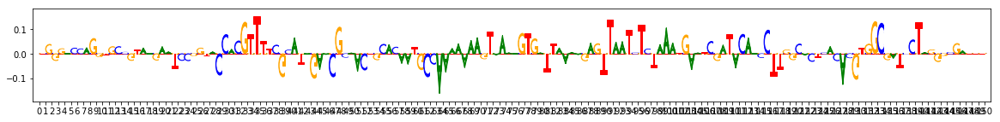

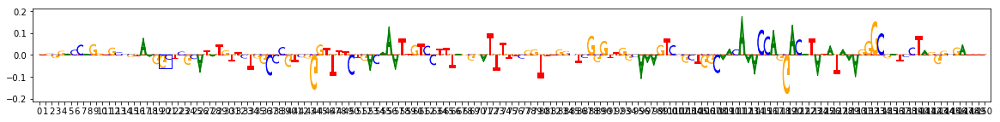

0: ACA


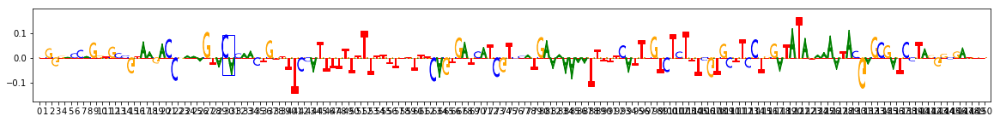

0: TAG


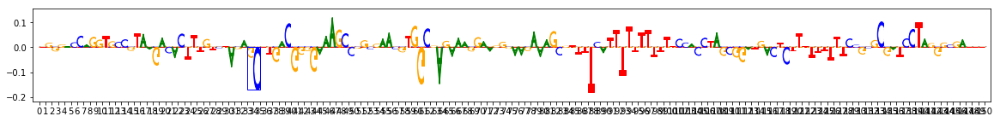

0: GCT


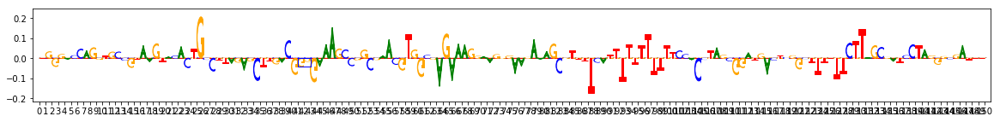

0: GGG


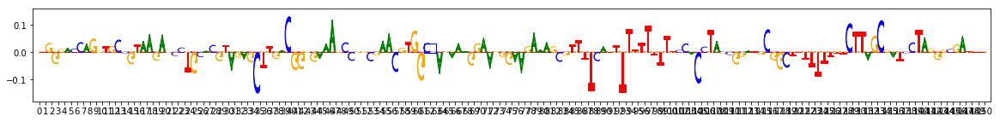

0: CGA


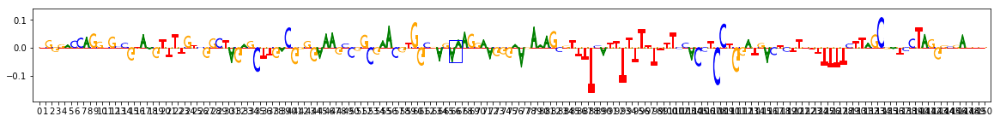

0: AAA


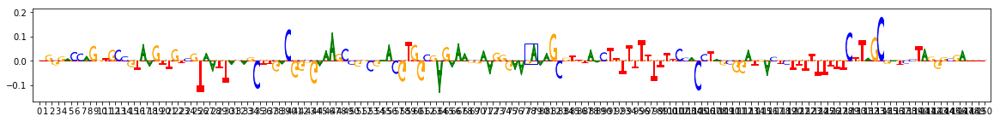

0: GAA


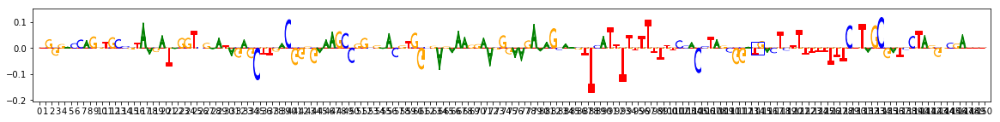

0: TGA


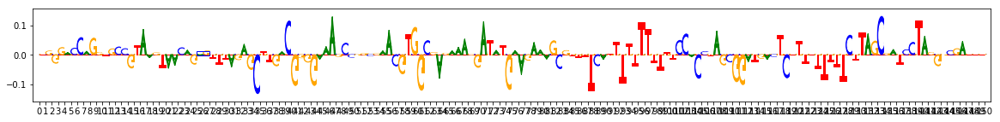

0: ACG


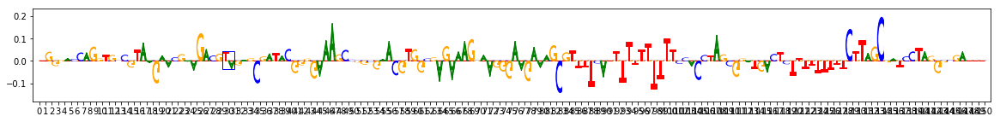

0: CGG


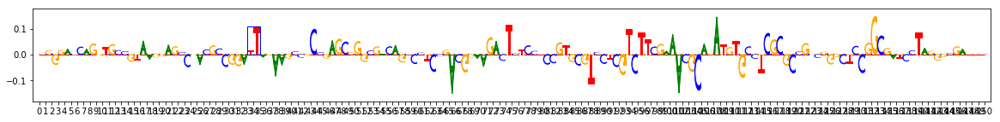

0: TTA


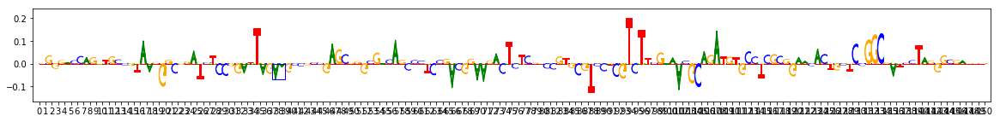

0: AAG


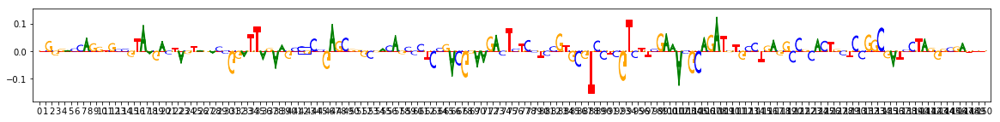

0: CGC


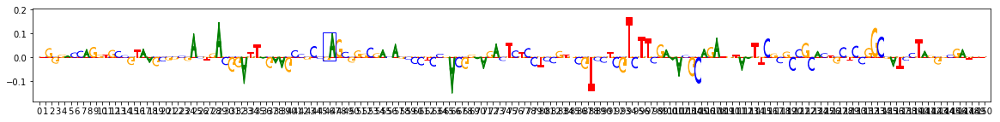

0: GAG


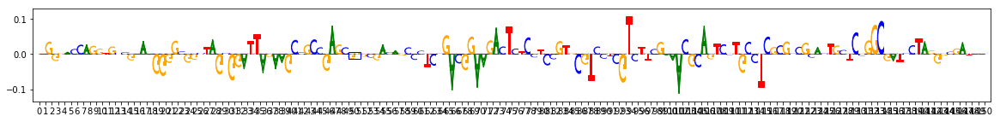

0: GGG


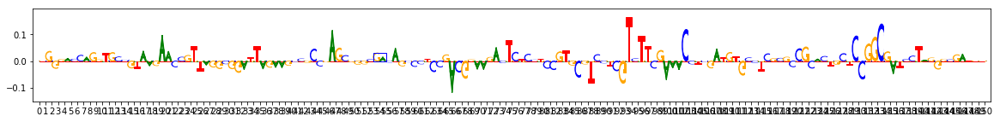

0: GAC


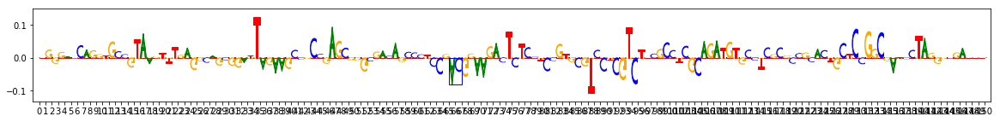

0: ACG


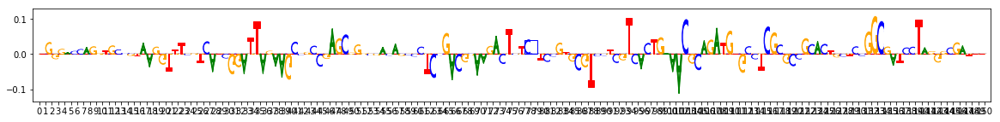

0: CCT


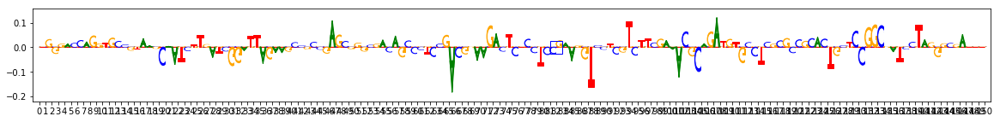

0: CGT


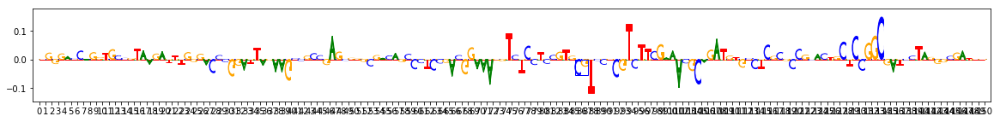

0: CGT
On task task0
Computing windowed sums on original
Generating null dist
peak(mu)= -0.030238754581508678
Computing threshold
Thresholds from null dist were -1.4681413767393678  and  1.210030623152852
Passing windows frac was 0.0003535038469536286 , which is below  0.03 ; adjusting
Final raw thresholds are -0.48498139288846814  and  0.48498139288846814
Final transformed thresholds are -0.9699985603915735  and  0.9699985603915735


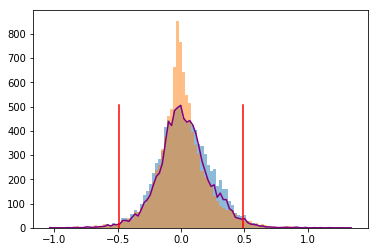

Got 2318 coords
After resolving overlaps, got 2318 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9699984603915736
2318 identified in total
2 activity patterns with support >= 100 out of 3 possible patterns
Metacluster sizes:  [1277, 1041]
Idx to activities:  {0: '-1', 1: '1'}
On metacluster 1
Metacluster size 1041
Relevant tasks:  ('task0',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 1041
(Round 1) Computing coarse affmat
Beginning embedding computation
Computing embeddings
Finished embedding computation in 13.19 s
Starting affinity matrix computations
Normalization computed in 0.19 s
Cosine similarity mat computed in 0.47 s
Normalization computed in 0.18 s
Cosine similarity mat computed in 0.46 s
Finished affinity matrix computations in 0.95 s
(Round 1) Compute nearest neighbors from coarse affmat
Computed nearest neighbors in 0.05 s
(Round 1) Computing affinity matrix on nearest neighbors
Launching nearest neigh

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.0s finished


Louvain completed 200 runs in 2.3653275966644287 seconds
Wrote graph to binary file in 0.2754509449005127 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.776854
Louvain completed 51 runs in 3.984196424484253 seconds
Preproc + Louvain took 6.924472808837891 s
Got 14 clusters after round 1
Counts:
{7: 55, 13: 9, 0: 176, 5: 60, 4: 66, 11: 23, 2: 83, 3: 68, 1: 96, 12: 13, 8: 49, 9: 39, 6: 55, 10: 37}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 176 seqlets
Trimmed 24 out of 176
Aggregating for cluster 1 with 96 seqlets
Trimmed 6 out of 96
Skipped 90 seqlets
Aggregating for cluster 2 with 83 seqlets
Trimmed 22 out of 83
Aggregating for cluster 3 with 68 seqlets
Trimmed 4 out of 68
Skipped 64 seqlets
Aggregating for cluster 4 with 66 seqlets
Trimmed 15 out of 66
Skipped 51 seqlets
Aggregating for cluster 5 with 60 seqlets
Trimmed 4 out of 60
Skipped 56 seqlets
Aggregating for cluster 6 with 55 seqlets
Trimmed 1 out of 

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.4537529945373535 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.3s finished


Wrote graph to binary file in 0.08041524887084961 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.704427
After 2 runs, maximum modularity is Q = 0.707214
Louvain completed 52 runs in 3.866253614425659 seconds
Preproc + Louvain took 5.497692823410034 s
Got 9 clusters after round 2
Counts:
{0: 69, 3: 35, 4: 34, 5: 27, 2: 42, 6: 22, 1: 52, 8: 3, 7: 4}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 69 seqlets
Trimmed 6 out of 69
Skipped 63 seqlets
Aggregating for cluster 1 with 52 seqlets
Trimmed 0 out of 52
Aggregating for cluster 2 with 42 seqlets
Trimmed 1 out of 42
Skipped 1 seqlets
Aggregating for cluster 3 with 35 seqlets
Trimmed 2 out of 35
Skipped 33 seqlets
Aggregating for cluster 4 with 34 seqlets
Trimmed 4 out of 34
Skipped 30 seqlets
Aggregating for cluster 5 with 27 seqlets
Trimmed 1 out of 27
Skipped 26 seqlets
Aggregating for cluster 6 with 22 seqlets
Trimmed 1 out of 22
Aggregating for cluster 7 with 4 

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.1s finished


Louvain completed 200 runs in 2.64080810546875 seconds
Wrote graph to binary file in 0.3972346782684326 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.854448
Louvain completed 51 runs in 4.137459754943848 seconds
Preproc + Louvain took 7.415145635604858 s
Got 14 clusters after round 1
Counts:
{4: 90, 1: 130, 7: 67, 10: 41, 2: 112, 0: 167, 12: 18, 3: 109, 13: 15, 8: 60, 11: 24, 9: 43, 5: 80, 6: 76}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 167 seqlets
Trimmed 19 out of 167
Skipped 1 seqlets
Aggregating for cluster 1 with 130 seqlets
Trimmed 32 out of 130
Aggregating for cluster 2 with 112 seqlets
Trimmed 13 out of 112
Skipped 95 seqlets
Aggregating for cluster 3 with 109 seqlets
Trimmed 26 out of 109
Skipped 83 seqlets
Aggregating for cluster 4 with 90 seqlets
Trimmed 13 out of 90
Aggregating for cluster 5 with 80 seqlets
Trimmed 3 out of 80
Aggregating for cluster 6 with 76 seqlets
Trimmed 3 out of 76
Skipped

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.783975601196289 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.6s finished


Wrote graph to binary file in 0.17061424255371094 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.812498
After 19 runs, maximum modularity is Q = 0.815015
Louvain completed 69 runs in 5.369060516357422 seconds
Preproc + Louvain took 7.549721002578735 s
Got 12 clusters after round 2
Counts:
{3: 59, 2: 76, 0: 90, 1: 86, 10: 14, 5: 50, 9: 19, 6: 35, 8: 24, 4: 58, 7: 33, 11: 12}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 90 seqlets
Trimmed 17 out of 90
Aggregating for cluster 1 with 86 seqlets
Trimmed 4 out of 86
Skipped 82 seqlets
Aggregating for cluster 2 with 76 seqlets
Trimmed 0 out of 76
Aggregating for cluster 3 with 59 seqlets
Trimmed 0 out of 59
Aggregating for cluster 4 with 58 seqlets
Trimmed 0 out of 58
Skipped 58 seqlets
Aggregating for cluster 5 with 50 seqlets
Trimmed 2 out of 50
Dropping cluster 5 with 48 seqlets due to sign disagreement
Aggregating for cluster 6 with 35 seqlets
Trimmed 1 out of 35
A

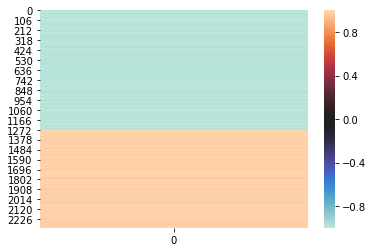

metacluster_0
activity pattern: [-1]
metacluster_0 pattern_0
Task 0 hypothetical scores:


/home/ryan/anaconda3/envs/genomics/lib/python3.6/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


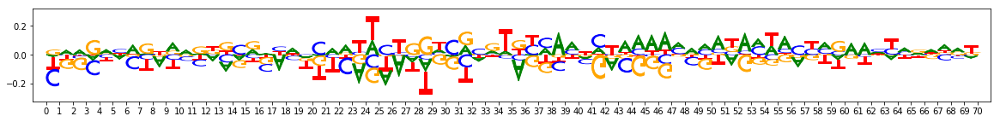

Task 0 actual importance scores:


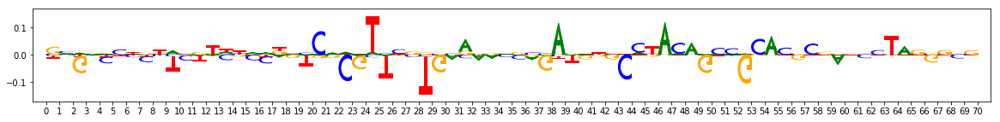

onehot, fwd and rev:


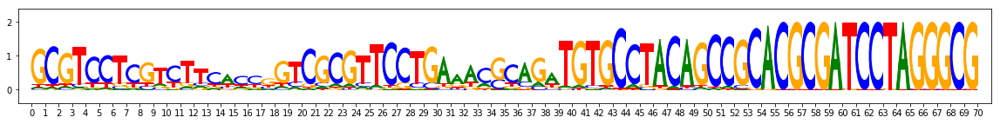

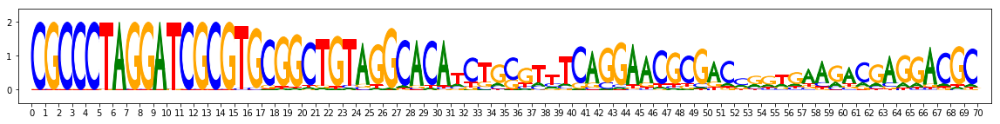

metacluster_0 pattern_1
Task 0 hypothetical scores:


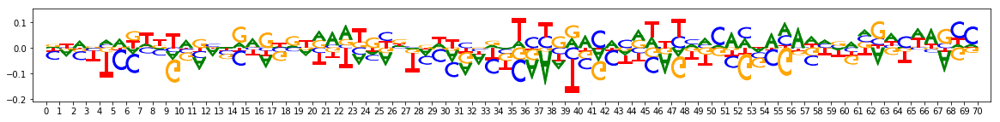

Task 0 actual importance scores:


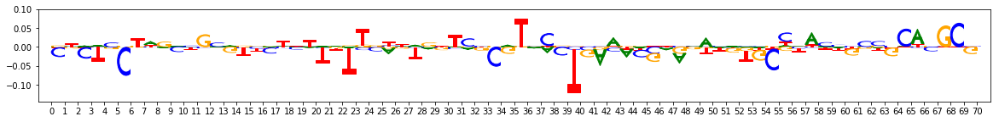

onehot, fwd and rev:


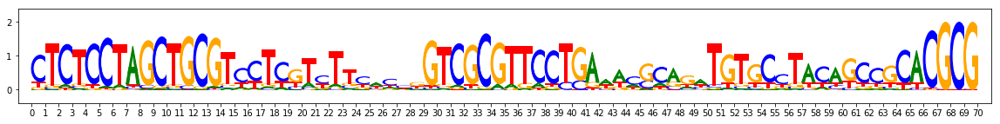

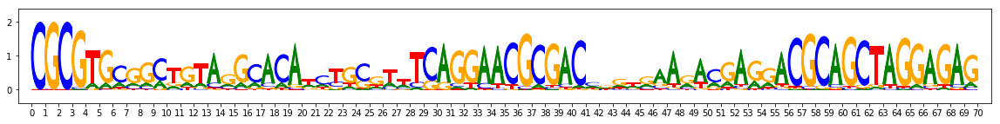

metacluster_0 pattern_2
Task 0 hypothetical scores:


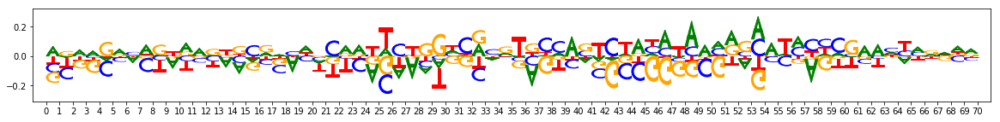

Task 0 actual importance scores:


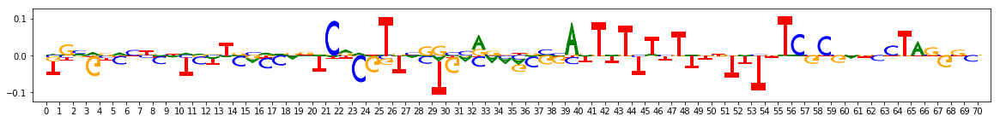

onehot, fwd and rev:


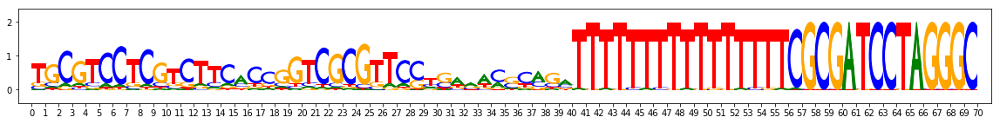

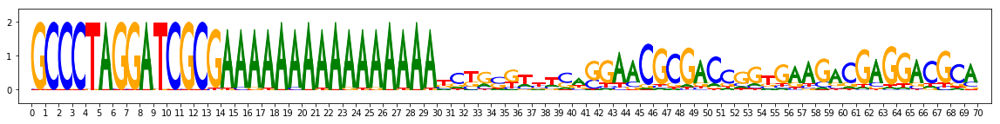

metacluster_1
activity pattern: [1]
metacluster_1 pattern_0
Task 0 hypothetical scores:


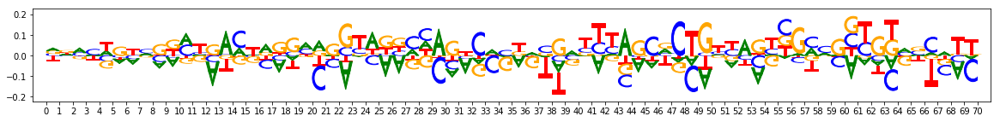

Task 0 actual importance scores:


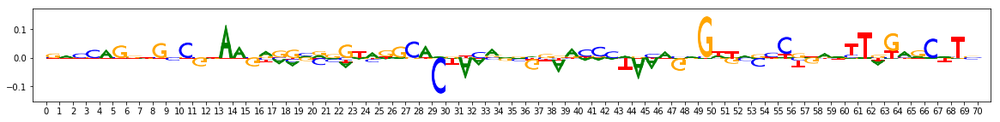

onehot, fwd and rev:


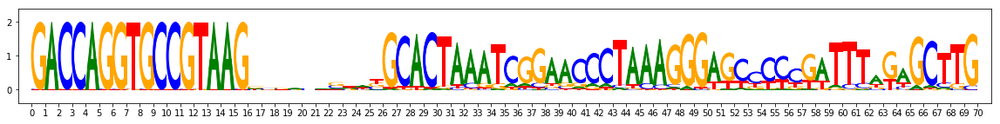

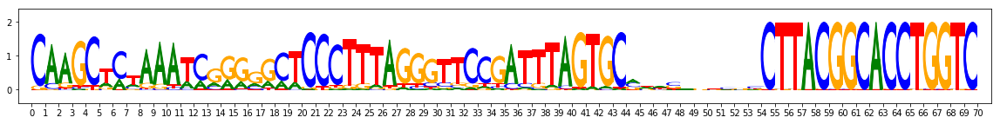

metacluster_1 pattern_1
Task 0 hypothetical scores:


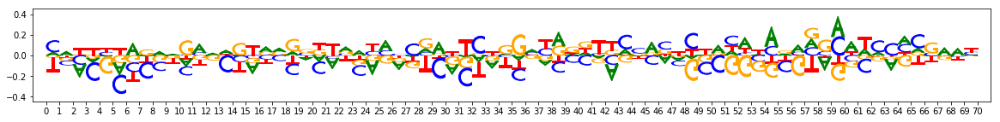

Task 0 actual importance scores:


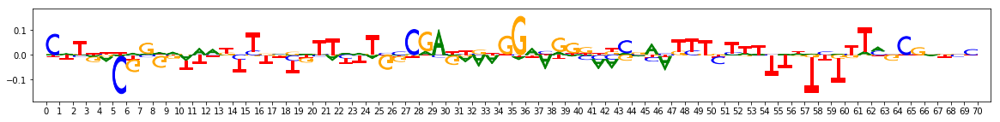

onehot, fwd and rev:


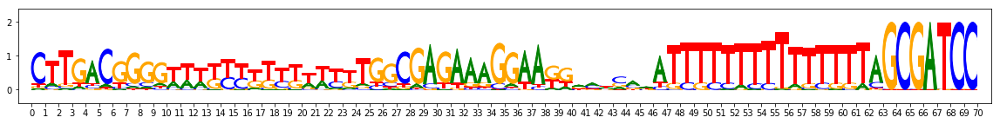

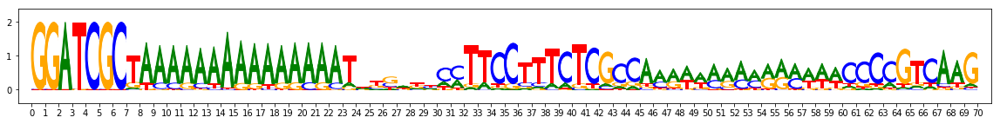

In [51]:
modiscos = []
ids = []
for k in range(6):
    scores = hyp_scores[k] * t.X[:,0, :, :]
    # scores = scores.mean(axis=0)
    hypothetical_scores = hyp_scores[k]
    t.plotDeepLift(scores, num=20, verbose=True)
    tfmodisco = t.tfmodiscoResults(scores, hypothetical_scores)
    modiscos.append(tfmodisco)
    id_list = dumb(tfmodisco)
    ids.append(id_list)

In [60]:
s = []
for i in ids:
    s.extend(list(i))
s = set(s)
s, len(s)

({67,
  78,
  79,
  90,
  92,
  96,
  97,
  98,
  106,
  110,
  111,
  150,
  197,
  215,
  218,
  223,
  234,
  235,
  240,
  242,
  407,
  449,
  458,
  460,
  462,
  464,
  470,
  471,
  473,
  485,
  497,
  504,
  505,
  506,
  509,
  516,
  518,
  521,
  528,
  530,
  550,
  551,
  558,
  563,
  570,
  573,
  574,
  576,
  595,
  596,
  597,
  598,
  602,
  605,
  613,
  620,
  622,
  630,
  632,
  633,
  635,
  639,
  642,
  644,
  647,
  651,
  660,
  674,
  678,
  679,
  685,
  686,
  689,
  691,
  696,
  711,
  712,
  720,
  723,
  724,
  728,
  732,
  746,
  755,
  756,
  761,
  762,
  763,
  764,
  765,
  768,
  770,
  773,
  780,
  793,
  804,
  805,
  808,
  813,
  815,
  816,
  817,
  818,
  821,
  822,
  824,
  825,
  826,
  831,
  836,
  839,
  840,
  843,
  851,
  854,
  861,
  862,
  867,
  868,
  870,
  871,
  872,
  873,
  874,
  883,
  887,
  888,
  906,
  911,
  912,
  918,
  936,
  959,
  979,
  982,
  985,
  987,
  988,
  1000,
  1010,
  1013,
  1014,
  1015,
  

## DeepLift Plotting

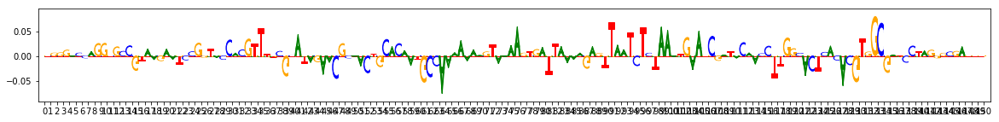

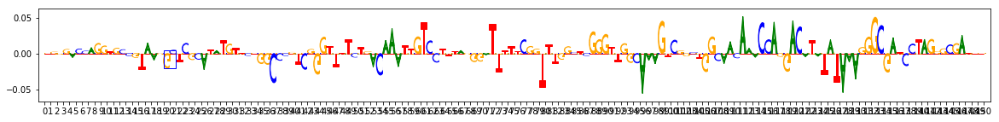

0: ACA


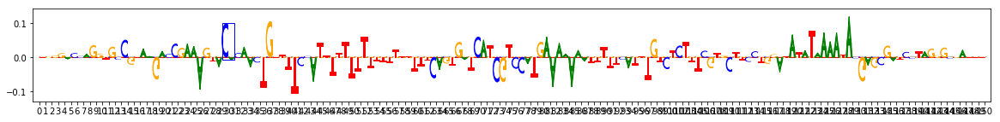

0: TAG


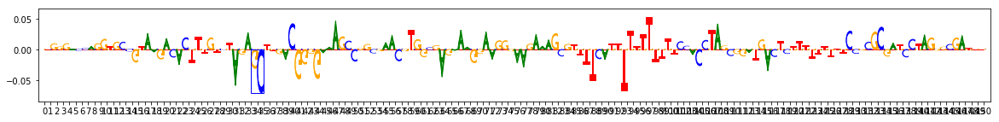

0: GCT


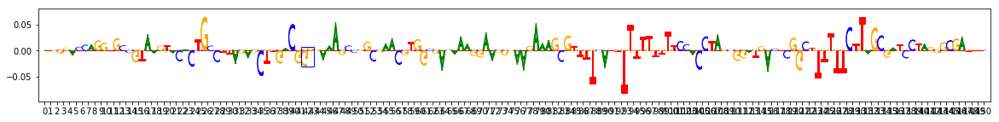

0: GGG


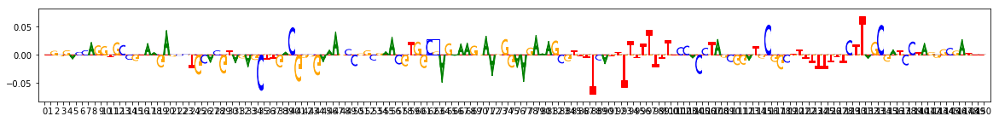

0: CGA


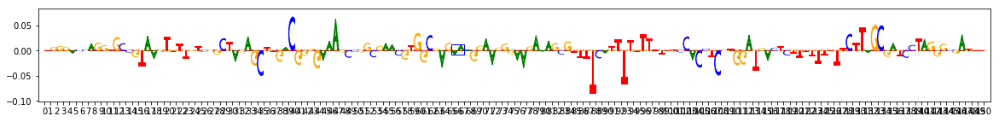

0: AAA


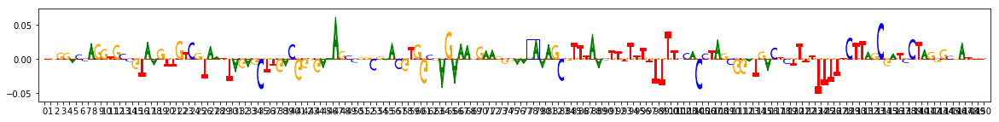

0: GAA


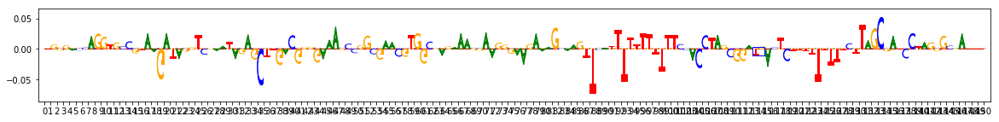

0: TGA


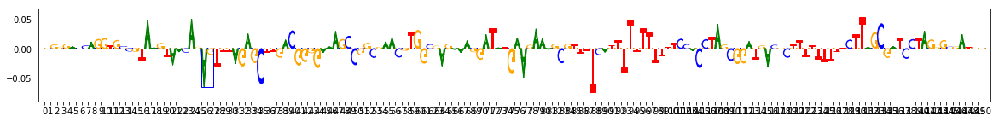

0: ACG


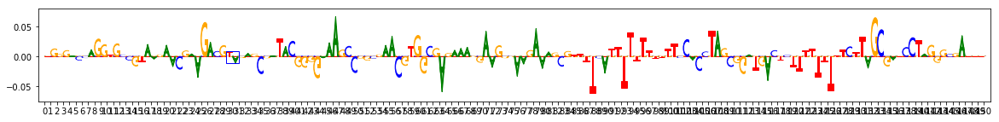

0: CGG


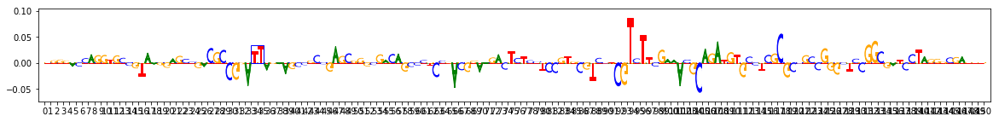

0: TTA


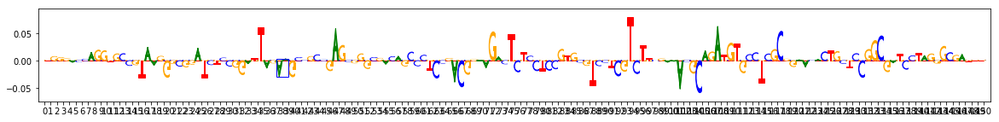

0: AAG


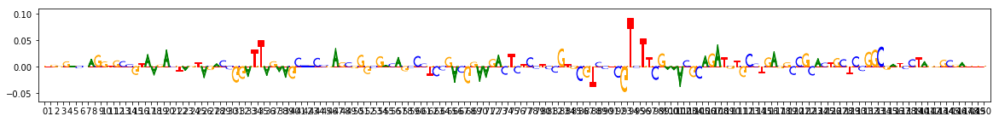

0: CGC


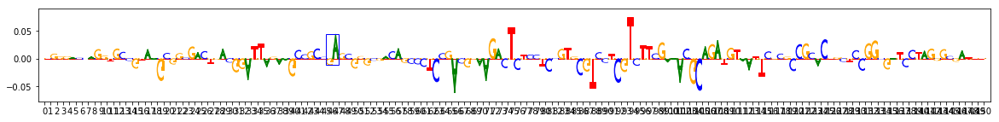

0: GAG


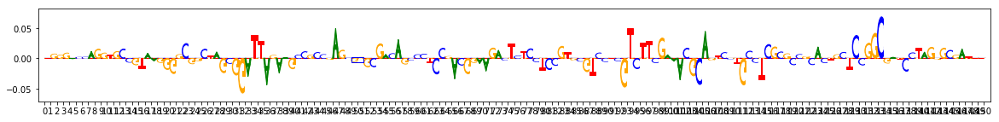

0: GGG


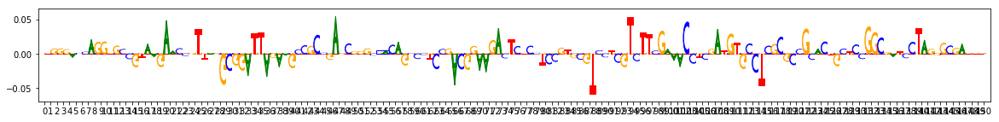

0: GAC


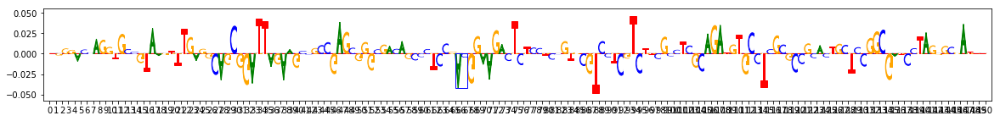

0: ACG


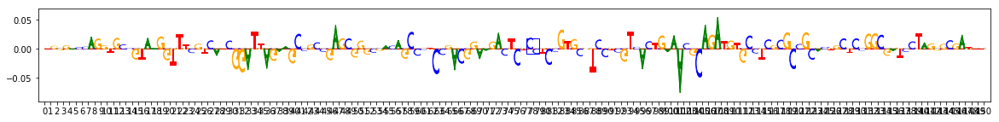

0: CCT


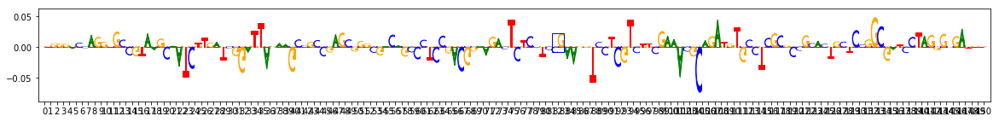

0: CGT


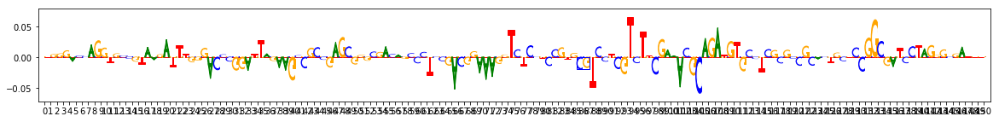

0: CGT


In [36]:
t.plotDeepLift(scores, num=20, verbose=True)

On task task0
Computing windowed sums on original
Generating null dist
peak(mu)= -0.011170742782665158
Computing threshold
Thresholds from null dist were -0.5633509938139469  and  0.5629174080677329
Passing windows frac was 0.00021274213413951406 , which is below  0.03 ; adjusting
Final raw thresholds are -0.22199244091671416  and  0.22199244091671416
Final transformed thresholds are -0.9699985603915735  and  0.9699985603915735


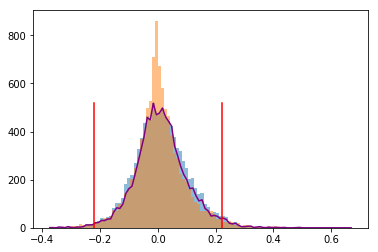

Got 1889 coords
After resolving overlaps, got 1889 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9699984603915736
1889 identified in total
2 activity patterns with support >= 100 out of 3 possible patterns
Metacluster sizes:  [1043, 846]
Idx to activities:  {0: '-1', 1: '1'}
On metacluster 1
Metacluster size 846
Relevant tasks:  ('task0',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 846
(Round 1) Computing coarse affmat
Beginning embedding computation
Computing embeddings
Finished embedding computation in 11.56 s
Starting affinity matrix computations
Normalization computed in 0.15 s
Cosine similarity mat computed in 0.36 s
Normalization computed in 0.17 s
Cosine similarity mat computed in 0.37 s
Finished affinity matrix computations in 0.75 s
(Round 1) Compute nearest neighbors from coarse affmat
Computed nearest neighbors in 0.05 s
(Round 1) Computing affinity matrix on nearest neighbors
Launching nearest neighbor

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.932795524597168 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.7s finished


Wrote graph to binary file in 0.17020344734191895 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.779517
Louvain completed 51 runs in 2.6673343181610107 seconds
Preproc + Louvain took 4.906423568725586 s
Got 13 clusters after round 1
Counts:
{5: 59, 7: 52, 3: 61, 11: 8, 8: 39, 1: 92, 0: 145, 12: 4, 6: 55, 2: 61, 4: 59, 9: 37, 10: 11}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 145 seqlets
Trimmed 13 out of 145
Aggregating for cluster 1 with 92 seqlets
Trimmed 8 out of 92
Skipped 83 seqlets
Aggregating for cluster 2 with 61 seqlets
Trimmed 1 out of 61
Skipped 60 seqlets
Aggregating for cluster 3 with 61 seqlets
Trimmed 9 out of 61
Skipped 52 seqlets
Aggregating for cluster 4 with 59 seqlets
Trimmed 11 out of 59
Skipped 48 seqlets
Aggregating for cluster 5 with 59 seqlets
Trimmed 6 out of 59
Aggregating for cluster 6 with 55 seqlets
Trimmed 27 out of 55
Aggregating for cluster 7 with 52 seqlets
Trimmed 3 out of 52

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.3685228824615479 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.3s finished


Wrote graph to binary file in 0.04560518264770508 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.694357
After 7 runs, maximum modularity is Q = 0.705687
After 16 runs, maximum modularity is Q = 0.705872
Louvain completed 66 runs in 3.3814854621887207 seconds
Preproc + Louvain took 4.859150409698486 s
Got 8 clusters after round 2
Counts:
{1: 39, 0: 46, 2: 33, 6: 14, 5: 23, 4: 32, 3: 32, 7: 8}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 46 seqlets
Trimmed 0 out of 46
Skipped 46 seqlets
Aggregating for cluster 1 with 39 seqlets
Trimmed 1 out of 39
Skipped 38 seqlets
Aggregating for cluster 2 with 33 seqlets
Trimmed 0 out of 33
Skipped 33 seqlets
Aggregating for cluster 3 with 32 seqlets
Trimmed 4 out of 32
Aggregating for cluster 4 with 32 seqlets
Trimmed 6 out of 32
Aggregating for cluster 5 with 23 seqlets
Trimmed 2 out of 23
Aggregating for cluster 6 with 14 seqlets
Trimmed 0 out of 14
Skipped 14 seqlets
Aggreg

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.8s finished


Louvain completed 200 runs in 2.132242441177368 seconds
Wrote graph to binary file in 0.25380921363830566 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.859375
Louvain completed 51 runs in 2.72117018699646 seconds
Preproc + Louvain took 5.291433572769165 s
Got 14 clusters after round 1
Counts:
{2: 104, 6: 63, 1: 105, 7: 62, 0: 107, 13: 9, 3: 84, 12: 11, 5: 72, 10: 25, 9: 32, 11: 20, 8: 49, 4: 82}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 107 seqlets
Trimmed 4 out of 107
Aggregating for cluster 1 with 105 seqlets
Trimmed 10 out of 105
Aggregating for cluster 2 with 104 seqlets
Trimmed 19 out of 104
Aggregating for cluster 3 with 84 seqlets
Trimmed 13 out of 84
Skipped 71 seqlets
Aggregating for cluster 4 with 82 seqlets
Trimmed 3 out of 82
Skipped 79 seqlets
Aggregating for cluster 5 with 72 seqlets
Trimmed 4 out of 72
Skipped 67 seqlets
Aggregating for cluster 6 with 63 seqlets
Trimmed 9 out of 63
Aggregating

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Louvain completed 200 runs in 1.6535589694976807 seconds


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.5s finished


Wrote graph to binary file in 0.1340022087097168 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.776544
After 9 runs, maximum modularity is Q = 0.779759
Louvain completed 59 runs in 3.0916450023651123 seconds
Preproc + Louvain took 5.032049655914307 s
Got 9 clusters after round 2
Counts:
{2: 75, 6: 19, 8: 13, 7: 18, 1: 90, 5: 22, 4: 53, 0: 95, 3: 73}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 95 seqlets
Trimmed 9 out of 95
Skipped 86 seqlets
Aggregating for cluster 1 with 90 seqlets
Trimmed 3 out of 90
Aggregating for cluster 2 with 75 seqlets
Trimmed 1 out of 75
Aggregating for cluster 3 with 73 seqlets
Trimmed 2 out of 73
Skipped 71 seqlets
Aggregating for cluster 4 with 53 seqlets
Trimmed 3 out of 53
Dropping cluster 4 with 50 seqlets due to sign disagreement
Aggregating for cluster 5 with 22 seqlets
Trimmed 0 out of 22
Aggregating for cluster 6 with 19 seqlets
Trimmed 0 out of 19
Dropping cluster 6 with 17 

In [37]:
tfmodisco = t.tfmodiscoResults(scores, hypothetical_scores)

## TFModisco Visualization

Added small loop through seqlets to find which examples they corresponded to. Aggregated all labelled samples into an `ids` set.

In [50]:

def dumb(tfmodisco):
    !rm 'tfmodiscoresults.hdf5'
    grp = h5py.File('tfmodiscoresults.hdf5')
    tfmodisco.save_hdf5(grp)
    hdf5_results = h5py.File('tfmodiscoresults.hdf5', 'r')

    print("Metaclusters heatmap")
    import seaborn as sns
    activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                        np.array(
            [x[0] for x in sorted(
                    enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
                   key=lambda x: x[1])])]
    sns.heatmap(activity_patterns, center=0)
    plt.show()

    metacluster_names = [
        x.decode("utf-8") for x in 
        list(hdf5_results["metaclustering_results"]
             ["all_metacluster_names"][:])]

    ids = set()

    all_patterns = []
    for metacluster_name in metacluster_names:
        print(metacluster_name)
        metacluster_grp = (hdf5_results["metacluster_idx_to_submetacluster_results"]
                                       [metacluster_name])
        print("activity pattern:",metacluster_grp["activity_pattern"][:])
        all_pattern_names = [x.decode("utf-8") for x in 
                             list(metacluster_grp["seqlets_to_patterns_result"]
                                                 ["patterns"]["all_pattern_names"][:])]
        if (len(all_pattern_names)==0):
            print("No motifs found for this activity pattern")
        for pattern_name in all_pattern_names:
            print(metacluster_name, pattern_name)
            all_patterns.append((metacluster_name, pattern_name))
            pattern = metacluster_grp["seqlets_to_patterns_result"]["patterns"][pattern_name]
            #print(pattern["seqlets_and_alnmts"]["seqlets"].value)

            for s in pattern['seqlets_and_alnmts']['seqlets'].value:
                ids.add(int(s.decode().split(',')[0].split(':')[1]))
            background = np.array([0.27, 0.23, 0.23, 0.27])
            print("Task 0 hypothetical scores:")
            viz_sequence.plot_weights(pattern["task0_hypothetical_contribs"]["fwd"])
            print("Task 0 actual importance scores:")
            viz_sequence.plot_weights(pattern["task0_contrib_scores"]["fwd"])
            print("onehot, fwd and rev:")
            viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["fwd"]),
                                                            background=background)) 
            viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["rev"]),
                                                            background=background)) 
    return ids

### Small Check

Prints out how many sequences do not have any associated motifs from TFModisco.

We printed out first 50 sequences, check how many of them were labelled with TFModisco

In [45]:
len([i for i in range(len(t.motifs.motifs)) if i not in ids])

4665

In [46]:
for i in range(5000):
    if i in ids:
        print(i)

97
98
106
471
473
598
605
639
678
755
763
808
818
822
825
826
836
861
870
871
1013
1014
1029
1030
1042
1078
1115
1139
1140
1148
1259
1265
1274
1275
1282
1299
1306
1323
1344
1345
1351
1354
1357
1358
1362
1363
1375
1531
1601
1709
1792
1796
1860
1923
1930
2070
2072
2092
2096
2126
2146
2276
2296
2340
2351
2377
2454
2519
2536
2538
2569
2573
2629
2632
2650
2657
2717
2763
2764
2791
2795
2798
2801
2844
2846
2848
2849
2855
2868
2899
2906
2950
3071
3073
3078
3115
3116
3119
3149
3271
3328
3389
3392
3458
3536
3593
3596
3648
3670
3672
3720
3929
4000
4003
4010
4023
4046
4097
4118
4184
4227
4233
4236
4242
4246
4250
4252
4263
4280
4286
4295
4297
4299
4301
4329
4337
4354
4366
4586
4601
4627
4630
4631
4632
